In [1]:
import pandas as pd
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import root_mean_squared_error, mean_squared_error, mean_absolute_error, r2_score, accuracy_score, roc_auc_score
from sklearn.linear_model import LinearRegression
from typing import Tuple, List, Any, Dict, Optional
from lightgbm import LGBMRegressor
import optuna
import plotly.graph_objects as go
from plotly import express as px
import shap

import warnings, os
import mysql.connector as mysql
warnings.filterwarnings('ignore')
username = os.environ['MYSQL_user']
password = os.environ['MYSQL_password']
DB = mysql.connect(host = "localhost", user = username, passwd = password, database = "AIRBNB")
cursor = DB.cursor(buffered=True)
SEED = 17
compare_metric_name = 'RMSE'

## Utils

In [2]:
def read_table_from_db(table_name):
    df = pd.read_sql(f'SELECT * FROM {table_name}', con=DB)
    for col in df.columns:
        if len(df[col].unique()) == 2 or (df[col].dtype == 'object' and len(df[col].unique()) < 10):
            df[col] = df[col].astype('category')
    return df

In [3]:
def base_information(data):
    df =  pd.DataFrame(data.dtypes, columns=['dtypes'])
    df['Number of missing values'] = data.isna().sum()
    df['Percentage of missing values'] = data.isna().sum()/data.shape[0]
    df['Unique values'] = data.nunique().values
    df['Count'] = data.count().values
    return df.style.background_gradient(cmap='Blues')

In [4]:
def perform_cv(X: pd.DataFrame, y: pd.Series, algorithm: Any, cv: sklearn.model_selection = KFold(n_splits=5, shuffle=True, random_state=SEED), metric: sklearn.metrics = root_mean_squared_error) -> Tuple[List[float], List[float]]:
    """
    Perform cross-validation and return list of scores
    
    Args:
        X (pd.DataFrame): input data
        y (pd.Series): target data
        algorithm (Any): algorithm to use for training and prediction
        cv (sklearn.model_selection, default=KFold(n_splits=5, shuffle=True, random_state=SEED)): cross-validation strategy
        metric (sklearn.metrics, default=root_mean_squared_error): metric to use for evaluation
    
    Returns:
        Tuple[List[float], List[float]]: Tuple of lists of train and validation scores
    """
    train_scores, validation_scores = [], []
    for train_idx, val_idx in cv.split(X, y):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        algorithm.fit(X_train, y_train)
        y_train_pred = algorithm.predict(X_train)
        y_val_pred = algorithm.predict(X_val)
        train_scores.append(metric(y_train, y_train_pred))
        validation_scores.append(metric(y_val, y_val_pred))
    return train_scores, validation_scores

def evaluation(X_train: pd.DataFrame, y_train: pd.Series, X_test: pd.DataFrame, y_test: pd.Series, algorithm: Any, metric: sklearn.metrics = root_mean_squared_error) -> Tuple[float, float, np.ndarray]:
    """
    Train the algorithm on the train data and evaluate on the train and test data
    
    Args:
        X_train (pd.DataFrame): input train data
        y_train (pd.Series): target train data
        X_test (pd.DataFrame): input test data
        y_test (pd.Series): target test data
        algorithm (Any): algorithm to use for training and prediction
        metric (sklearn.metrics, default=root_mean_squared_error): metric to use for evaluation
    
    Returns:
        Tuple[float, float, np.ndarray]: train_score, test_score, predictions on test data
    """
    algorithm.fit(X_train, y_train)
    y_train_pred = algorithm.predict(X_train)
    y_test_pred = algorithm.predict(X_test)
    train_results = metric(y_train, y_train_pred)
    test_results = metric(y_test, y_test_pred)
    return train_results, test_results, y_test_pred

# Load dataset

In [5]:
data = read_table_from_db('airbnb_data')
target_feature = 'log_price'
independent_features = data.columns.drop(target_feature)
categorical_features = data[independent_features].select_dtypes(include=['category']).columns.tolist()
room_type_mappings = {
    "Entire home/apt": "Całe mieszkanie/dom",
    "Private room": "Pokój prywatny",
    "Shared room": "Pokój współdzielony",
    "Hotel room": "Pokój hotelowy",
}
data['room_type'] = data['room_type'].map(room_type_mappings).astype('category')
data

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,district,property_type,room_type,accommodates,...,number_of_kitchen_images,number_of_dining_room_images,number_of_outside_building_images,number_of_urban_environment_images,number_of_other_images,avg_warmth_hue,avg_saturation,avg_brightness,avg_contrast_brightness,avg_clarity
0,within a day,51-90%,0-50%,0,1,1,Manhattan,Apartment,Całe mieszkanie/dom,1,...,3,4,0,2,1,0.858955,0.347937,0.612404,0.219364,0.406733
1,within a day,100%,0-50%,0,1,1,Brooklyn,Apartment,Pokój prywatny,2,...,1,3,0,0,0,0.786527,0.335939,0.702361,0.197192,0.561365
2,within an hour,100%,100%,1,1,1,Brooklyn,Apartment,Całe mieszkanie/dom,3,...,1,5,1,0,0,0.766307,0.196585,0.797081,0.166314,0.807861
3,within a day,0-50%,0-50%,0,1,1,Manhattan,Apartment,Pokój prywatny,1,...,0,0,1,1,0,0.692493,0.273260,0.516383,0.232102,0.250748
4,within an hour,100%,100%,1,1,1,Manhattan,Apartment,Pokój prywatny,1,...,3,1,0,1,4,0.890491,0.410061,0.510274,0.235629,0.264580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19454,within a few hours,51-90%,51-90%,0,1,1,Brooklyn,Apartment,Pokój prywatny,1,...,2,0,0,0,0,0.850956,0.143719,0.641540,0.210288,0.573581
19455,within a few hours,100%,51-90%,0,1,1,Brooklyn,House,Pokój prywatny,2,...,3,2,2,0,0,0.870749,0.173025,0.624783,0.208991,0.461112
19456,within an hour,100%,51-90%,0,1,1,Staten Island,House,Pokój prywatny,2,...,2,1,6,0,0,0.672730,0.259213,0.477982,0.221113,0.244029
19457,a few days or more,0-50%,0-50%,0,0,1,Brooklyn,Apartment,Pokój prywatny,1,...,0,0,0,0,0,0.715691,0.217306,0.513331,0.242898,0.273807


In [6]:
base_information(data)

,dtypes,Number of missing values,Percentage of missing values,Unique values,Count
host_response_time,category,0,0.000000,5,19459
host_response_rate,category,0,0.000000,5,19459
host_acceptance_rate,category,0,0.000000,5,19459
host_is_superhost,category,0,0.000000,2,19459
host_has_profile_pic,category,0,0.000000,2,19459
host_identity_verified,category,0,0.000000,2,19459
district,category,0,0.000000,5,19459
property_type,category,0,0.000000,3,19459
room_type,category,0,0.000000,4,19459
accommodates,int64,0,0.000000,16,19459


## Split dataset

In [7]:
train_data, test_data = train_test_split(data, test_size=0.2, random_state=SEED)

## Baseline - Linear Regression

In [8]:
model = LinearRegression()
train_data_temp = train_data.copy()
train_data_temp = pd.get_dummies(train_data_temp, columns=categorical_features, drop_first=True)
independent_features_temp = train_data_temp.columns.drop(target_feature)
train_scores, validation_scores = perform_cv(train_data_temp[independent_features_temp], train_data_temp[target_feature], model, cv=KFold(n_splits=5, shuffle=True, random_state=SEED), metric=root_mean_squared_error)
print(f"Train {compare_metric_name}: {np.mean(train_scores):.4f} +- {np.std(train_scores):.4f}")
print(f"Validation {compare_metric_name}: {np.mean(validation_scores):.4f} +- {np.std(validation_scores):.4f}")

Train RMSE: 0.3917 +- 0.0010
Validation RMSE: 0.3963 +- 0.0040


## Base LightGBM model

In [9]:
model = LGBMRegressor(random_state=SEED, verbose=-1, n_jobs=-1, objective='regression', metric=compare_metric_name, linear_tree=False)
train_scores, validation_scores = perform_cv(train_data[independent_features], train_data[target_feature], model, cv=KFold(n_splits=5, shuffle=True, random_state=SEED), metric=root_mean_squared_error)
print(f"Train {compare_metric_name}: {np.mean(train_scores):.4f} +- {np.std(train_scores):.4f}")
print(f"Validation {compare_metric_name}: {np.mean(validation_scores):.4f} +- {np.std(validation_scores):.4f}")

Train RMSE: 0.2548 +- 0.0010
Validation RMSE: 0.3188 +- 0.0063


## LightGBM model with `linear_tree` parameter

In [10]:
model = LGBMRegressor(random_state=SEED, verbose=-1, n_jobs=-1, objective='regression', metric=compare_metric_name, linear_tree=True)
train_scores, validation_scores = perform_cv(train_data[independent_features], train_data[target_feature], model, cv=KFold(n_splits=5, shuffle=True, random_state=SEED), metric=root_mean_squared_error)
print(f"Train {compare_metric_name}: {np.mean(train_scores):.4f} +- {np.std(train_scores):.4f}")
print(f"Validation {compare_metric_name}: {np.mean(validation_scores):.4f} +- {np.std(validation_scores):.4f}")

Train RMSE: 0.2310 +- 0.0015
Validation RMSE: 0.3192 +- 0.0058


Altough the validation score is a little bit worse for the `linear_tree` model, the training score is much better.

Also after investigation it looks like for other metrics like `MAE` or `MSE` the `linear_tree` model is better (also on the validation set).

The problem is currently that there are some strange "outliers" predicitons in the `linear_tree` model which we will try to fix in the next steps.

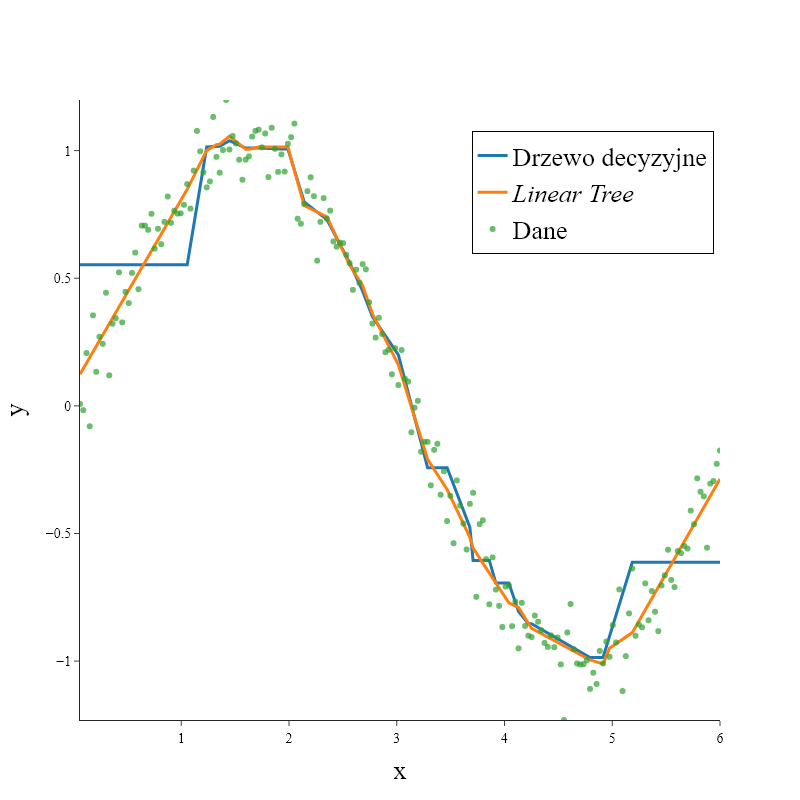

In [11]:
n = 200
np.random.seed(1)
X = np.linspace(0, 6, n).reshape(n, 1)
y = np.sin(X) + 0.1 * np.random.randn(*X.shape)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2)

params = {
    "objective": "regression",
    "metric": "rmse",
    "num_leaves": 30,
    "learning_rate": 0.1,
    "verbosity": -1
}

# fitting
model_linear = LGBMRegressor(**params, linear_tree=True)
model_normal = LGBMRegressor(**params, linear_tree=False)

model_linear.fit(X_train, y_train)
model_normal.fit(X_train, y_train)

y_pred_linear = model_linear.predict(X_test)
y_pred_normal = model_normal.predict(X_test)

# plotting results
df = pd.DataFrame(X_test, columns=['x'])
df['y (regular trees)'] = y_pred_normal
df['y (linear trees)'] = y_pred_linear
df = df.sort_values('x')

fig = go.Figure()
fig.add_trace(go.Scatter(x=df['x'], y=df['y (regular trees)'], mode='lines', name='Drzewo decyzyjne', line=dict(width=3)))
fig.add_trace(go.Scatter(x=df['x'], y=df['y (linear trees)'], mode='lines', name='<i>Linear Tree<i>', line=dict(width=3)))
fig.add_trace(go.Scatter(x=X.flatten(), y=y.flatten(), mode='markers', name='Dane', marker=dict(opacity=0.7)))
fig.update_layout(template="simple_white", width=800, height=800, font=dict(family="Times New Roman",size=26,color="Black"))
fig.update_layout(legend=dict(yanchor="top", y=0.95, xanchor="right", x=0.99, bgcolor="rgba(255, 255, 255, 0)", bordercolor="Black", borderwidth=1))
fig.update_xaxes(title_text="x", title_font=dict(size=26), tickfont=dict(size=14), range=[X_test.min(), X_test.max()])
fig.update_yaxes(title_text="y", title_font=dict(size=26), tickfont=dict(size=14), range=[y.min(), y.max()])
fig.show("png")

## Scores with OneHotEncoding

In [12]:
df_temp = data.copy()
df_temp = pd.get_dummies(df_temp, columns=categorical_features, drop_first=True, dtype='int8')
independent_features_temp = df_temp.columns.drop(target_feature)
train_data_temp, test_data_temp = train_test_split(df_temp, test_size=0.2, random_state=SEED)
model = LGBMRegressor(random_state=SEED, verbose=-1, n_jobs=-1, objective='regression', metric=compare_metric_name, linear_tree=True)
train_scores, validation_scores = perform_cv(train_data_temp[independent_features_temp], train_data_temp[target_feature], model, cv=KFold(n_splits=5, shuffle=True, random_state=SEED), metric=root_mean_squared_error)
print(f"Train {compare_metric_name}: {np.mean(train_scores):.4f} +- {np.std(train_scores):.4f}")
print(f"Validation {compare_metric_name}: {np.mean(validation_scores):.4f} +- {np.std(validation_scores):.4f}")

Train RMSE: 0.2327 +- 0.0011
Validation RMSE: 0.3276 +- 0.0192


As we can see after applying OneHotEncoding we receive worse results than with the categorical features provided to LightGBM.

In [13]:
def evaluate(train_data: pd.DataFrame, test_data: pd.DataFrame, independent_features: list[str], target_feature: str, model: Any) -> pd.DataFrame:
    """
    Evaluate different feature sets and return results in a DataFrame.

    Args:
        train_data (pd.DataFrame): Training data.
        test_data (pd.DataFrame): Testing data.
        independent_features (list[str]): List of independent feature names.
        target_feature (str): Target feature name.
        model (Any): Model to use for training and prediction.

    Returns:
        pd.DataFrame: DataFrame containing evaluation results for each feature set.
    """
    X_train = train_data[independent_features]
    y_train = train_data[target_feature]
    X_test = test_data[independent_features]
    y_test = test_data[target_feature]
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    metrics = {
        'R2': r2_score,
        'R2_adj': lambda y_true, y_pred: 1 - (1 - r2_score(y_true, y_pred)) * (len(y_true) - 1) / (len(y_true) - X_train.shape[1] - 1),
        'MSE': mean_squared_error,
        'RMSE': root_mean_squared_error,
        'MAE': mean_absolute_error,
    }
    
    # Calculate metrics for train and test
    train_metrics = {f"{name}": metric(y_train, y_train_pred) for name, metric in metrics.items()}
    test_metrics = {f"{name}": metric(y_test, y_test_pred) for name, metric in metrics.items()}
    
    # Create multi-index columns
    columns = pd.MultiIndex.from_tuples([
        ('Zbiór treningowy', 'R^2'),
        ('Zbiór treningowy', 'R_adj^2'),
        ('Zbiór treningowy', 'MSE'),
        ('Zbiór treningowy', 'RMSE'),
        ('Zbiór treningowy', 'MAE'),
        ('Zbiór testowy', 'R^2'),
        ('Zbiór testowy', 'R_adj^2'),
        ('Zbiór testowy', 'MSE'),
        ('Zbiór testowy', 'RMSE'),
        ('Zbiór testowy', 'MAE'),
    ])
    
    # Combine metrics in the correct order
    values = [
        train_metrics['R2'],
        train_metrics['R2_adj'],
        train_metrics['MSE'],
        train_metrics['RMSE'],
        train_metrics['MAE'],
        test_metrics['R2'],
        test_metrics['R2_adj'],
        test_metrics['MSE'],
        test_metrics['RMSE'],
        test_metrics['MAE'],
    ]
    return pd.DataFrame([values], columns=columns)

model = LGBMRegressor(random_state=SEED, verbose=-1, n_jobs=-1, objective='regression', metric=compare_metric_name, linear_tree=True)
results_df = evaluate(train_data, test_data, independent_features, target_feature, model)
results_df

Zbiór treningowy                                        Zbiór testowy  \
               R^2   R_adj^2       MSE     RMSE       MAE           R^2   
0         0.890853  0.890218  0.059282  0.24348  0.184965      0.808416   

                                         
   R_adj^2       MSE     RMSE       MAE  
0  0.80388  0.108103  0.32879  0.233933

# Different features combinations

In [14]:
image_features = ["number_of_images", "number_of_bedroom_images", "number_of_bathroom_images", "number_of_living_room_images", "number_of_kitchen_images", "number_of_dining_room_images", "number_of_outside_building_images", "number_of_urban_environment_images", "number_of_other_images", "avg_warmth_hue", "avg_saturation", "avg_brightness", "avg_contrast_brightness", "avg_clarity"]
radius_meters = 100
location_features = ['distance_to_nearest_crime_m', f'number_of_crimes_within_{radius_meters}m', f'average_offence_weight_within_{radius_meters}m',
                    'distance_to_nearest_bus_stop_m', f'number_of_bus_stops_within_{radius_meters}m',
                    'distance_to_nearest_subway_station_m', f'number_of_subway_stations_within_{radius_meters}m',
                    'distance_to_nearest_restaurant_m', f'number_of_restaurants_within_{radius_meters}m',
                    'distance_to_nearest_education_institution_m', f'number_of_education_institutions_within_{radius_meters}m',
                    'distance_to_nearest_cultural_institution_m', f'number_of_cultural_institutions_within_{radius_meters}m',
                    'distance_to_nearest_recreation_point_m', f'number_of_recreation_points_within_{radius_meters}m',
                    'distance_to_nearest_religious_institution_m', f'number_of_religious_institutions_within_{radius_meters}m',
                    'distance_to_nearest_health_institution_m', f'number_of_health_institutions_within_{radius_meters}m',
                    'distance_to_nearest_main_attraction_m']
listing_characteristics = data.columns.drop(target_feature).drop(image_features).drop(location_features).tolist()

features_sets: dict[str, list[list[str]]] = {
    "listing_characteristics": listing_characteristics,
    "location_features": location_features,
    "image_features": image_features,
    "listing_characteristics+location_features": listing_characteristics+location_features,
    "listing_characteristics+image_features": listing_characteristics+image_features,
    "location_features+image_features": location_features+image_features,
    "listing_characteristics+location_features+image_features": listing_characteristics+location_features+image_features
}
model = LGBMRegressor(random_state=SEED, verbose=-1, n_jobs=-1, objective='regression', metric=compare_metric_name, linear_tree=True)
results = {}
for feature_set_name, feature_set in features_sets.items():
    results[feature_set_name] = evaluate(train_data, test_data, feature_set, target_feature, model)
results_df = pd.concat(results.values(), keys=results.keys())
results_df = results_df.swaplevel(axis=0).round(2)
results_df

Zbiór treningowy          \
                                                                  R^2 R_adj^2   
0 listing_characteristics                                        0.85    0.85   
  location_features                                              0.53    0.53   
  image_features                                                 0.50    0.50   
  listing_characteristics+location_features                      0.88    0.88   
  listing_characteristics+image_features                         0.87    0.87   
  location_features+image_features                               0.65    0.65   
  listing_characteristics+location_features+image...             0.89    0.89   

                                                                        \
                                                       MSE  RMSE   MAE   
0 listing_characteristics                             0.08  0.28  0.21   
  location_features                                   0.25  0.50  0.40   
  image_features                                      0.27  0.52  0.41   
  listing_characteristics+location_features           0.06  0.25  0.19   
  listing_characteristics+image_features              0.07  0.27  0.20   
  location_features+image_features                    0.19  0.44  0.34   
  listing_characteristics+location_features+image...  0.06  0.24  0.18   

                                                     Zbiór testowy          \
                                                               R^2 R_adj^2   
0 listing_characteristics                                     0.79    0.79   
  location_features                                           0.33    0.33   
  image_features                                              0.31    0.30   
  listing_characteristics+location_features                   0.81    0.81   
  listing_characteristics+image_features                      0.80    0.80   
  location_features+image_features                            0.48    0.47   
  listing_characteristics+location_features+image...          0.81    0.80   

                                                                        
                                                       MSE  RMSE   MAE  
0 listing_characteristics                             0.12  0.34  0.25  
  location_features                                   0.38  0.61  0.49  
  image_features                                      0.39  0.63  0.49  
  listing_characteristics+location_features           0.11  0.33  0.24  
  listing_characteristics+image_features              0.11  0.34  0.25  
  location_features+image_features                    0.30  0.54  0.43  
  listing_characteristics+location_features+image...  0.11  0.33  0.23

# Hyperparameter optimization

In this section, we will optimize the hyperparameters of the LightGBM model.

In [15]:
class RandomSearchCV:
    def __init__(
        self,
        algorithm: Any,
        metric: str,
        cv: sklearn.model_selection.BaseCrossValidator = KFold(n_splits=5, shuffle=True, random_state=17),
        n_trials: int = 100,
        seed: int = 17,
        gap_weight: float = 0.3,
    ):
        self.algorithm = algorithm
        self.cv = cv
        self.n_trials = n_trials
        self.seed = seed
        self.gap_weight = gap_weight

        self.metrics = {
            "accuracy": [accuracy_score, "preds", "maximize"],
            "roc_auc": [roc_auc_score, "probs", "maximize"],
            "mse": [mean_squared_error, "preds", "minimize"],
            "rmse": [root_mean_squared_error, "preds", "minimize"],
            "mae": [mean_absolute_error, "preds", "minimize"],
        }

        if metric not in self.metrics:
            raise ValueError(f"Unsupported metric: {metric}")

        self.eval_metric = self.metrics[metric][0]
        self.metric_type = self.metrics[metric][1]
        self.direction = self.metrics[metric][2]

    def tune(
        self,
        X: pd.DataFrame,
        y: pd.Series,
        params_grid: Dict[str, Tuple[str, List[Any]]],
        X_valid: Optional[pd.DataFrame] = None,
        y_valid: Optional[pd.Series] = None,
    ) -> optuna.study.Study:
        self.params_grid = params_grid
        study = self.create_study()
        X, y = self.check_X(X), self.check_y(y)

        if X_valid is not None and y_valid is not None:
            X_valid = self.check_X(X_valid)
            y_valid = self.check_y(y_valid)
            study.optimize(lambda trial: self.objective(trial, X, y, X_valid, y_valid), n_trials=self.n_trials)
        else:
            study.optimize(lambda trial: self.objective_cv(trial, X, y), n_trials=self.n_trials)

        return study

    def create_study(self) -> optuna.study.Study:
        sampler = optuna.samplers.TPESampler(seed=self.seed)
        return optuna.create_study(
            direction=self.direction,
            sampler=sampler,
            study_name="Airbnb_study"
        )

    def get_param(self, trial: optuna.Trial, param_name: str, param_values: Tuple[str, List[Any]]) -> Any:
        param_type, param_value = param_values
        if param_type == "int":
            return trial.suggest_int(param_name, *param_value)
        elif param_type == "float":
            return trial.suggest_float(param_name, *param_value, log=True)
        elif param_type == "categorical":
            return trial.suggest_categorical(param_name, param_value)
        elif param_type == "constant":
            return param_value[0]

    def objective(self, trial: optuna.Trial, X_train: pd.DataFrame, y_train: pd.Series,
                  X_valid: pd.DataFrame, y_valid: pd.Series) -> float:
        params = {k: self.get_param(trial, k, v) for k, v in self.params_grid.items()}
        model = self.algorithm.set_params(**params)
        model.fit(X_train, y_train)
        preds = model.predict(X_valid) if self.metric_type == "preds" else model.predict_proba(X_valid)[:, 1]
        return self.eval_metric(y_valid, preds)

    def objective_cv(self, trial: optuna.Trial, X: pd.DataFrame, y: pd.Series) -> float:
        params = {k: self.get_param(trial, k, v) for k, v in self.params_grid.items()}
        self.algorithm.set_params(**params)

        valid_scores = []

        for train_idx, valid_idx in self.cv.split(X):
            X_train, X_valid = X.iloc[train_idx], X.iloc[valid_idx]
            y_train, y_valid = y.iloc[train_idx], y.iloc[valid_idx]

            self.algorithm.fit(
                X_train,
                y_train,
                eval_set=[(X_valid, y_valid)],
                eval_metric="rmse",
                
            )
            y_valid_pred = self.algorithm.predict(X_valid) if self.metric_type == "preds" else self.algorithm.predict_proba(X_valid)[:, 1]
            valid_scores.append(self.eval_metric(y_valid, y_valid_pred))

        mean_valid = np.mean(valid_scores)
        return mean_valid

    @staticmethod
    def check_X(X: Any) -> pd.DataFrame:
        return X if isinstance(X, pd.DataFrame) else pd.DataFrame(X)

    @staticmethod
    def check_y(y: Any) -> pd.Series:
        return y if isinstance(y, pd.Series) else pd.Series(y)

model = LGBMRegressor()
cv = RandomSearchCV(
    algorithm=model,
    metric="rmse",
    cv=KFold(n_splits=5, shuffle=True, random_state=SEED),
    n_trials=200,
    seed=SEED
)
ids_of_categorical = [col for col in train_data.columns if train_data[col].dtype.name == 'category']
params_grid = {
    "objective": ("constant", ["regression"]),
    "metric": ("constant", [compare_metric_name]),
    "linear_tree": ("constant", [True]),
    "seed": ("constant", [SEED]),
    "verbose": ("constant", [-1]),
    "n_jobs": ("constant", [-1]),
    "boosting_type": ("constant", ["gbdt"]),
    "n_estimators": ("int", [50, 1000]),
    "num_leaves": ("int", [10, 450]),
    "min_child_samples": ("int", [10, 300]),
    "max_depth": ("int", [3, 30]),
    "subsample": ("float", [0.3, 1]),
    "colsample_bytree": ("float", [0.3, 1]),
    "learning_rate": ("float", [1e-3, 0.5]),
    "reg_alpha": ("float", [1e-3, 30]),
    "reg_lambda": ("float", [1e-3, 30]),
    "linear_lambda": ("float", [1e-3, 30]),
}

study = cv.tune(
    train_data[independent_features],
    train_data[target_feature],
    params_grid
)

[I 2025-04-19 08:40:28,293] A new study created in memory with name: Airbnb_study
[I 2025-04-19 08:40:30,412] Trial 0 finished with value: 0.31891407529815474 and parameters: {'n_estimators': 330, 'num_leaves': 243, 'min_child_samples': 65, 'max_depth': 4, 'subsample': 0.7737830722497602, 'colsample_bytree': 0.6611562428979949, 'learning_rate': 0.05255932457101159, 'reg_alpha': 0.37761040255451583, 'reg_lambda': 0.0014958547068972478, 'linear_lambda': 0.03999216300149093}. Best is trial 0 with value: 0.31891407529815474.
[I 2025-04-19 08:40:40,687] Trial 1 finished with value: 0.3062789802716444 and parameters: {'n_estimators': 949, 'num_leaves': 36, 'min_child_samples': 261, 'max_depth': 27, 'subsample': 0.31907247004783607, 'colsample_bytree': 0.6580472549057305, 'learning_rate': 0.030843268446461337, 'reg_alpha': 0.4733030314189369, 'reg_lambda': 0.1461558763011785, 'linear_lambda': 0.01849150715170984}. Best is trial 1 with value: 0.3062789802716444.
[I 2025-04-19 08:40:46,903] Tri

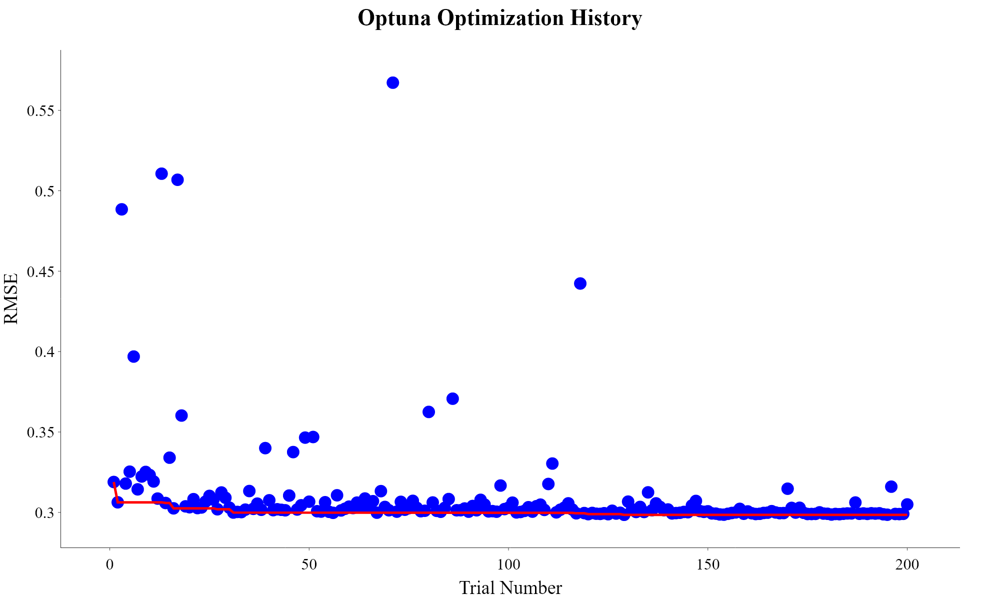

In [16]:
scores = study.trials_dataframe()
fig = go.Figure()
scores.index = scores.index + 1
fig.add_trace(go.Scatter(x=scores.index, y=scores["value"], mode="markers", name="Trial Score", marker=dict(size=25, color="blue"), showlegend=False))
minimum_scores = []
for i in range(len(scores)):
    minimum_scores.append(scores.loc[:i+1, "value"].min())
fig.add_trace(go.Scatter(x=scores.index, y=minimum_scores, mode="lines", name="Minimum Score", line=dict(color="red", width=5), showlegend=False))
fig.update_layout(template="simple_white", width=2000, height=1200, title="<b>Optuna Optimization History<b>", title_x=0.5, xaxis_title="Trial Number", yaxis_title=compare_metric_name, font=dict(family="Times New Roman",size=32,color="Black"), showlegend=False)
fig.show("png")

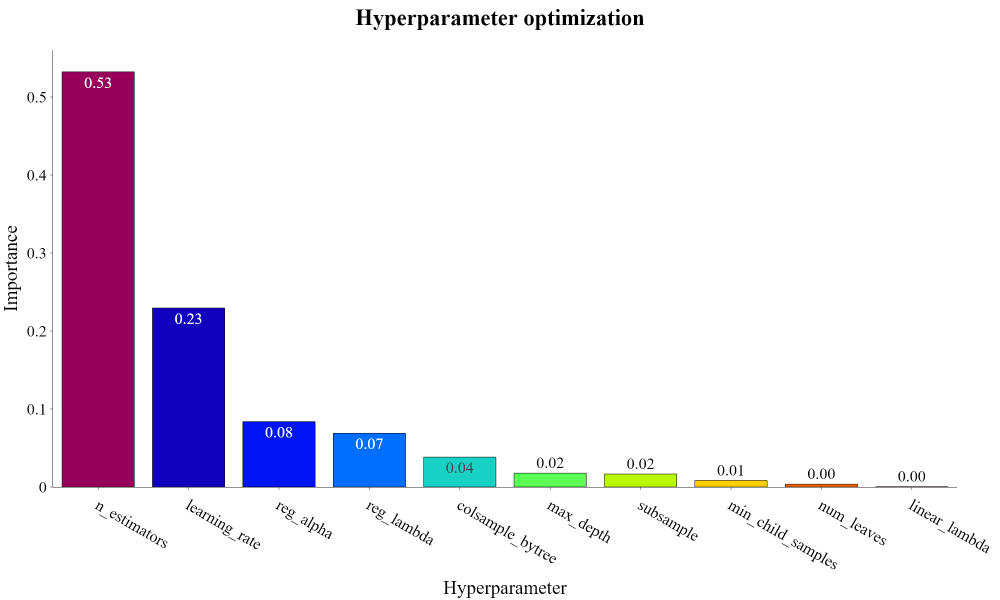

In [17]:
importances = optuna.importance.get_param_importances(study)
fig = go.Figure()
n_colors = len(importances)
colors = px.colors.sample_colorscale("rainbow", [n/(n_colors -1) for n in range(n_colors)])
fig.add_trace(go.Bar(x=list(importances.keys()), y=list(importances.values()), marker=dict(color=colors, line=dict(color='black', width=1), line_color='black'), text=[f"{v:.2f}" for v in list(importances.values())], textposition="auto"))
fig.update_layout(template="simple_white", width=2000, height=1200, title="<b>Hyperparameter optimization<b>", title_x=0.5, xaxis_title="Hyperparameter", yaxis_title=f"Importance", font=dict(family="Times New Roman",size=32,color="Black"), showlegend=False)
fig.show("png")

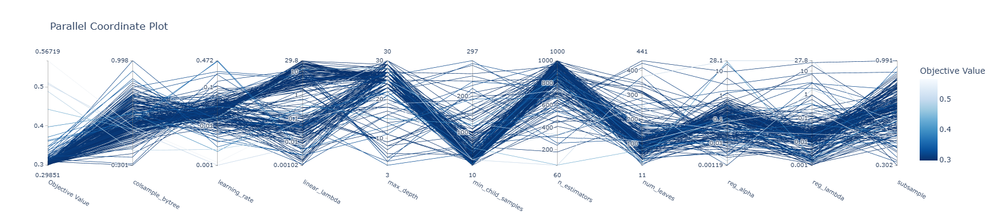

In [18]:
optuna.visualization.plot_parallel_coordinate(study)

# Evaluation

In [ ]:
best_params = study.best_trial.params
best_params

{'n_estimators': 969,
 'num_leaves': 93,
 'min_child_samples': 10,
 'max_depth': 27,
 'subsample': 0.6072066276738372,
 'colsample_bytree': 0.4302486265345959,
 'learning_rate': 0.03391177974069248,
 'reg_alpha': 0.24391259552612354,
 'reg_lambda': 0.02842012638149048,
 'linear_lambda': 3.602237773003333}

In [15]:
best_params = {'n_estimators': 969, 'num_leaves': 93,
 'min_child_samples': 10,
 'max_depth': 27,
 'subsample': 0.6072066276738372,
 'colsample_bytree': 0.4302486265345959,
 'learning_rate': 0.03391177974069248,
 'reg_alpha': 0.24391259552612354,
 'reg_lambda': 0.02842012638149048,
 'linear_lambda': 53.602237773003333}

In [16]:
base_model = LGBMRegressor(random_state=SEED, verbose=-1, n_jobs=-1, objective='regression', metric=compare_metric_name, linear_tree=True)
tuned_model = LGBMRegressor(**best_params, random_state=SEED, verbose=-1, n_jobs=-1, objective='regression', metric=compare_metric_name, linear_tree=True)
model_names = ['Model base', 'Model tuned']
results = {}
for model_name, model in zip(model_names, [base_model, tuned_model]):
    results[model_name] = evaluate(train_data, test_data, independent_features, target_feature, model)
results_df = pd.concat(results.values(), keys=results.keys())
results_df = results_df.swaplevel(axis=0).round(2)
results_df

Zbiór treningowy                           Zbiór testowy  \
                           R^2 R_adj^2   MSE  RMSE   MAE           R^2   
0 Model base              0.89    0.89  0.06  0.24  0.18          0.81   
  Model tuned             1.00    1.00  0.00  0.05  0.03          0.84   

                                         
              R_adj^2   MSE  RMSE   MAE  
0 Model base     0.80  0.11  0.33  0.23  
  Model tuned    0.84  0.09  0.30  0.21

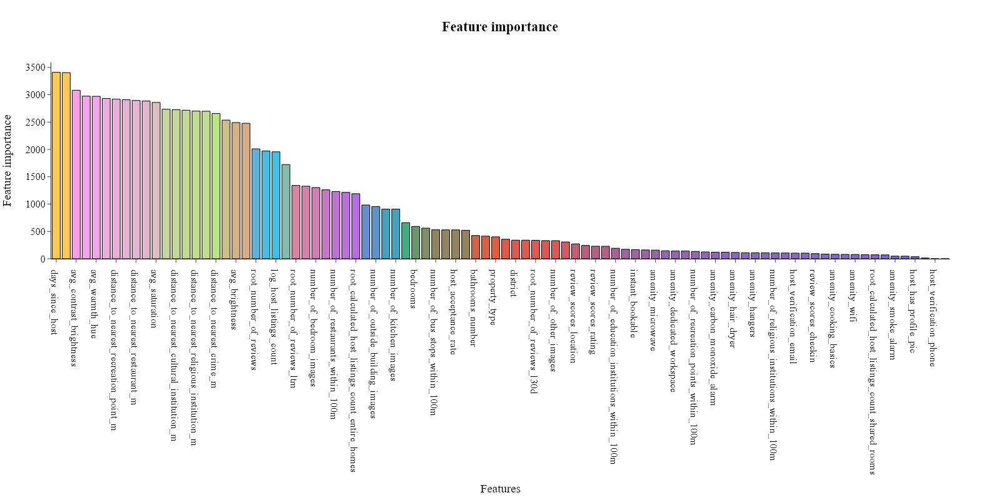

In [17]:
def simple_feature_importance(feature_importance, importance_type):
    sorted = feature_importance.sort_values(by=importance_type, ascending=False)
    colors = px.colors.qualitative.Plotly
    fig = go.Figure()
    fig.add_trace(go.Bar(x=sorted.index, y=sorted[importance_type], marker=dict(color=sorted[importance_type], colorscale=colors, line=dict(color='black', width=1))))
    fig.update_layout(template="simple_white", width=1600, height=800, title_text="<b>Feature importance<b>", title_x=0.5, yaxis_title="Feature importance", xaxis=dict(title='Features', showticklabels=True, type="category"), font=dict(family="Times New Roman",size=16,color="Black"))
    fig.show("png")

tuned_model.fit(train_data[independent_features], train_data[target_feature])
y_test_pred = tuned_model.predict(test_data[independent_features])
feature_importance_df = pd.DataFrame({'feature': train_data[independent_features].columns, 'importance': tuned_model.feature_importances_}).set_index('feature')
simple_feature_importance(feature_importance_df, 'importance')

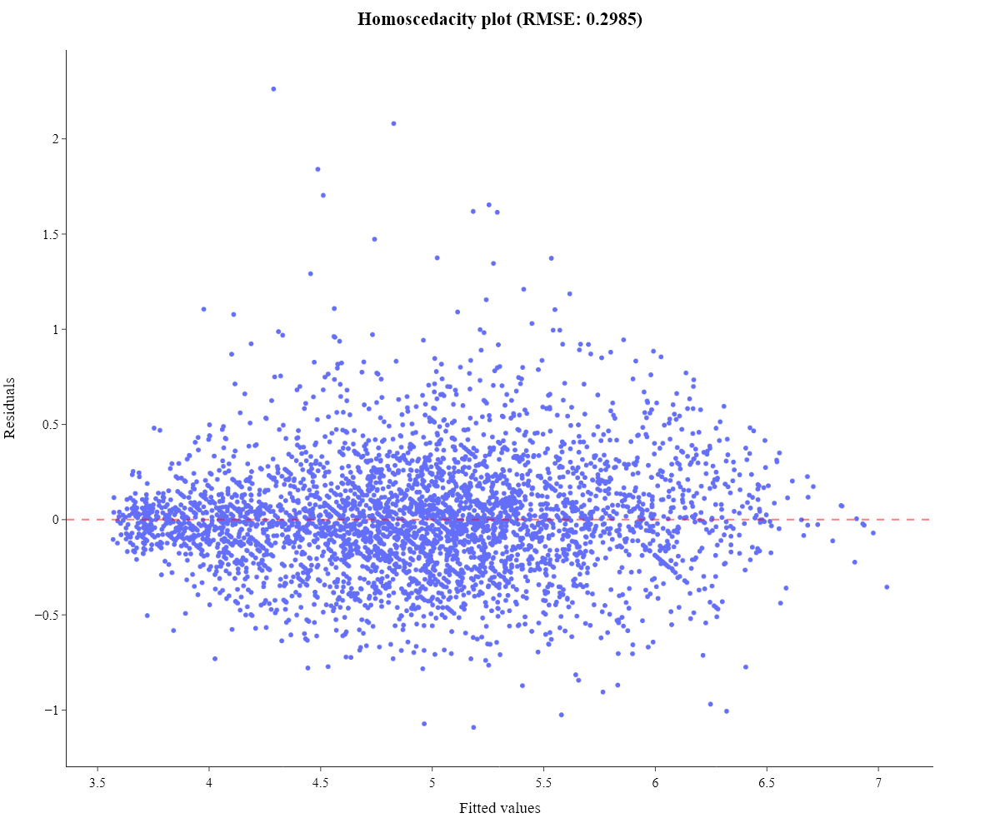

In [18]:
y_test = test_data[target_feature]
y_test_pred = tuned_model.predict(test_data[independent_features])

def homoscedacity_plot(y_true, y_pred, metric="RMSE"):
    metrics = { "MSE": mean_squared_error(y_true, y_pred),
            "RMSE": root_mean_squared_error(y_true, y_pred),
            "MAE": mean_absolute_error(y_true, y_pred)}
    if metric not in metrics:
        raise ValueError('Unsupported metric: {}'.format(metric))
    eval_metric = np.round(metrics[metric], 5)
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    residuals = y_true - y_pred
    fig = px.scatter(x=y_pred, y=residuals, labels={"x": "Fitted values",  "y": "Residuals"})
    fig.add_shape(type="line", line_color="red", line_width=2, opacity=0.5, line_dash="dash",x0=0, x1=1, xref="paper", y0=0, y1=0, yref="y")
    fig.update_layout(template="simple_white", width=1200, height=1000, title=f"<b>Homoscedacity plot ({metric.upper()}: {eval_metric:.4f})<b>", title_x=0.5, xaxis_title="Fitted values", yaxis_title="Residuals", font=dict(family="Times New Roman",size=16,color="Black"))
    fig.show("png")

homoscedacity_plot(y_test, y_test_pred, metric="RMSE")

In [19]:
#Show those observations where error is more than 2
residuals = y_test - y_test_pred
outliers = np.abs(residuals) > 2
outliers_df = pd.DataFrame({'y_true': y_test, 'y_pred': y_test_pred, 'residuals': residuals, 'outlier': outliers})
outliers_df[outliers]
#Get those observations from test_data to check features
test_data[outliers]

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,district,property_type,room_type,accommodates,...,number_of_kitchen_images,number_of_dining_room_images,number_of_outside_building_images,number_of_urban_environment_images,number_of_other_images,avg_warmth_hue,avg_saturation,avg_brightness,avg_contrast_brightness,avg_clarity
17528,within a few hours,91-99%,51-90%,0,1,1,Manhattan,Apartment,Pokój prywatny,2,...,2,1,0,0,1,0.864345,0.180957,0.732446,0.241146,0.673077
15951,within an hour,100%,100%,0,1,1,Manhattan,Apartment,Pokój prywatny,2,...,0,0,1,1,1,0.792053,0.173094,0.538012,0.257591,0.304004


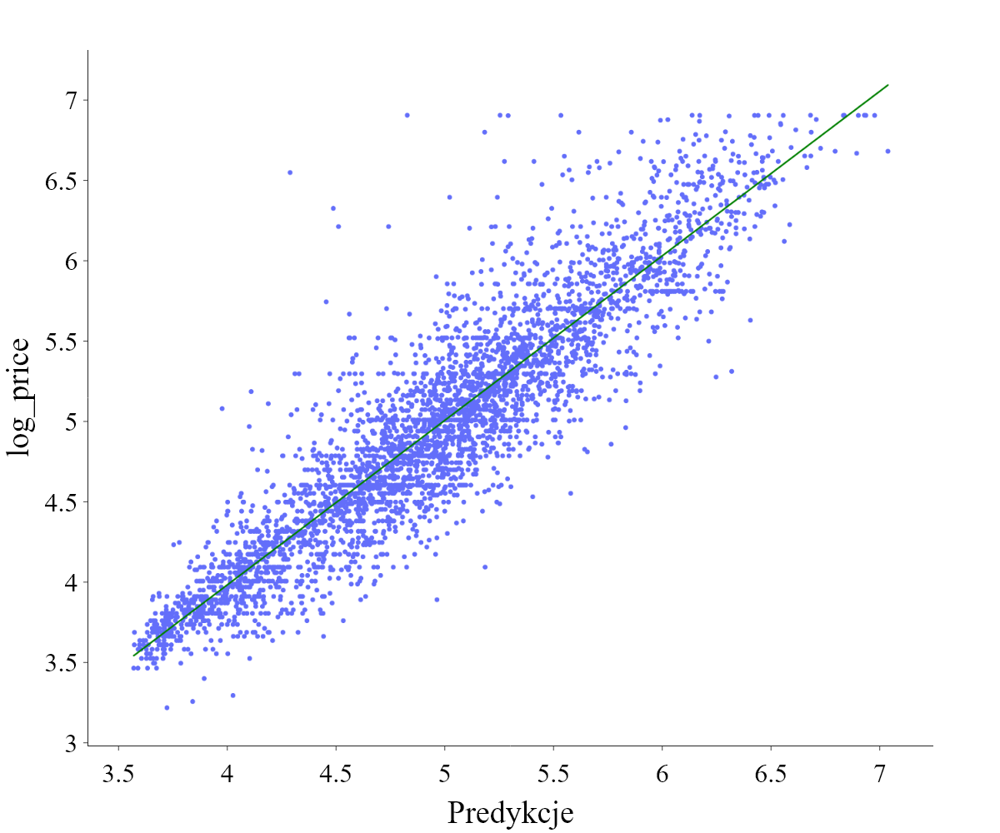

In [ ]:
def true_vs_fitted_plot(y_true, y_pred, metric="RMSE"):
    metrics = { "MSE": mean_squared_error(y_true, y_pred),
            "RMSE": root_mean_squared_error(y_true, y_pred),
            "MAE": mean_absolute_error(y_true, y_pred)}
    if metric not in metrics:
        raise ValueError('Unsupported metric: {}'.format(metric))
    eval_metric = np.round(metrics[metric], 5)
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    fig = px.scatter(x=y_pred, y=y_true, labels={"x": "Fitted values",  "y": "True values"}, trendline="ols", trendline_color_override="green", trendline_options=dict(log_x=True, log_y=True))
    fig.data[1].line.width = 8
    fig.update_layout(template="simple_white", width=1200, height=1000, xaxis_title="Predykcje", yaxis_title="log_price", font=dict(family="Times New Roman",size=32,color="Black"))
    fig.update_xaxes(range=[np.min(y_pred) - 0.01 * np.min(y_pred), np.max(y_pred) + 0.01 * np.max(y_pred)])
    fig.update_yaxes(range=[np.min(y_true) - 0.01 * np.min(y_true), np.max(y_true) + 0.01 * np.max(y_true)])
    fig.show("png")

true_vs_fitted_plot(y_test, y_test_pred, metric="RMSE")

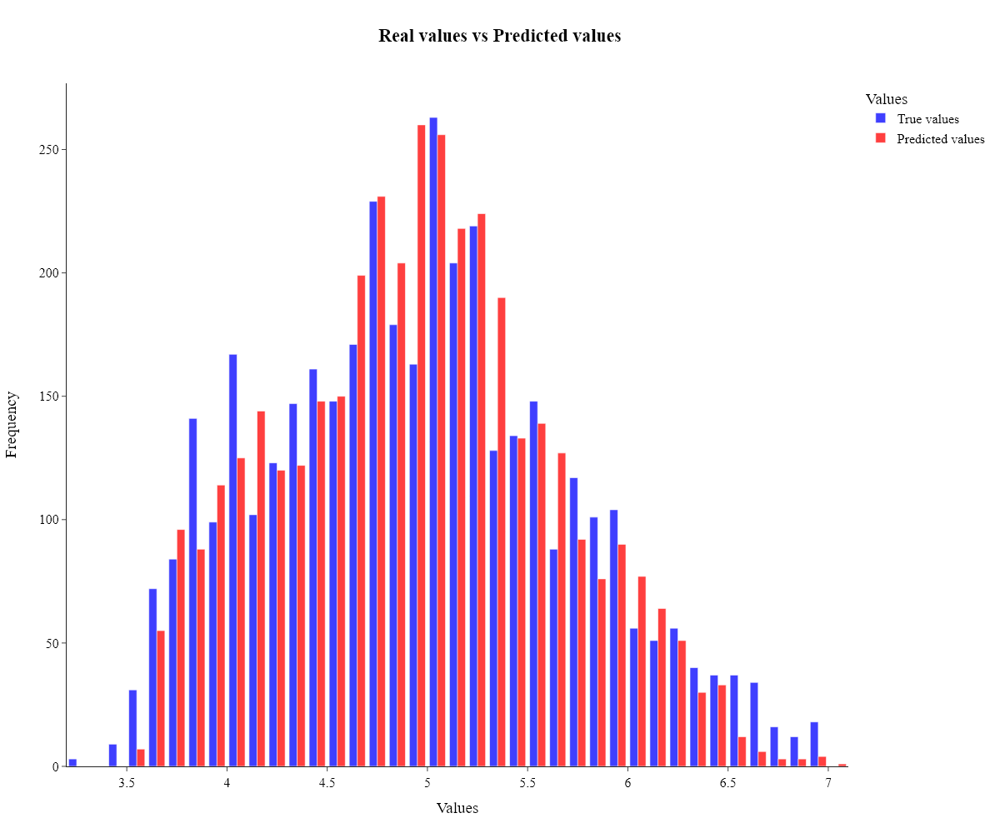

In [ ]:
def histogram_comparison(y_true, y_pred, bin_size=0.1):
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=y_true, marker_color='blue', name='True values', opacity=0.75, xbins=dict(size=bin_size)))
    fig.add_trace(go.Histogram(x=y_pred, marker_color='red', name='Predicted values', opacity=0.75, xbins=dict(size=bin_size)))
    fig.update_layout(template="simple_white", width=1200, height=1000, title="<b>Real values vs Predicted values<b>", title_x=0.5, xaxis_title="Values", yaxis_title="Frequency", font=dict(family="Times New Roman",size=16,color="Black"), legend_title_text='Values')
    fig.show("png")

histogram_comparison(y_test, y_test_pred)

# Shapley values

In [ ]:
#Niestety na ten moment shap nie obsługuje linear_tree=True
X_train = train_data[independent_features]
y_train = train_data[target_feature]
X_test = test_data[independent_features]
y_test = test_data[target_feature]
model = LGBMRegressor(random_state=SEED, verbose=-1, n_jobs=-1, objective='regression', metric=compare_metric_name, linear_tree=False, **best_params)
model.fit(X_train, y_train)

results_df = evaluate(train_data, test_data, independent_features, target_feature, model)
results_df

Zbiór treningowy                                        Zbiór testowy  \
               R^2   R_adj^2      MSE      RMSE       MAE           R^2   
0         0.987517  0.987444  0.00678  0.082342  0.062341      0.840323   

                                         
    R_adj^2     MSE      RMSE       MAE  
0  0.836542  0.0901  0.300166  0.216544

In [ ]:
explainer = shap.TreeExplainer(model)
shap_values = explainer(X_test)

## Local

In [ ]:
i_med = np.argsort(y_test_pred)[len(y_test_pred)//2]
i_max = np.argmax(y_test_pred)
i_80 = np.argsort(y_test_pred)[int(len(y_test_pred)*0.8)]
i_60 = np.argsort(y_test_pred)[int(len(y_test_pred)*0.6)]
i_40 = np.argsort(y_test_pred)[int(len(y_test_pred)*0.4)]
i_20 = np.argsort(y_test_pred)[int(len(y_test_pred)*0.2)]
i_min = np.argmin(y_test_pred)

### Waterfall plot

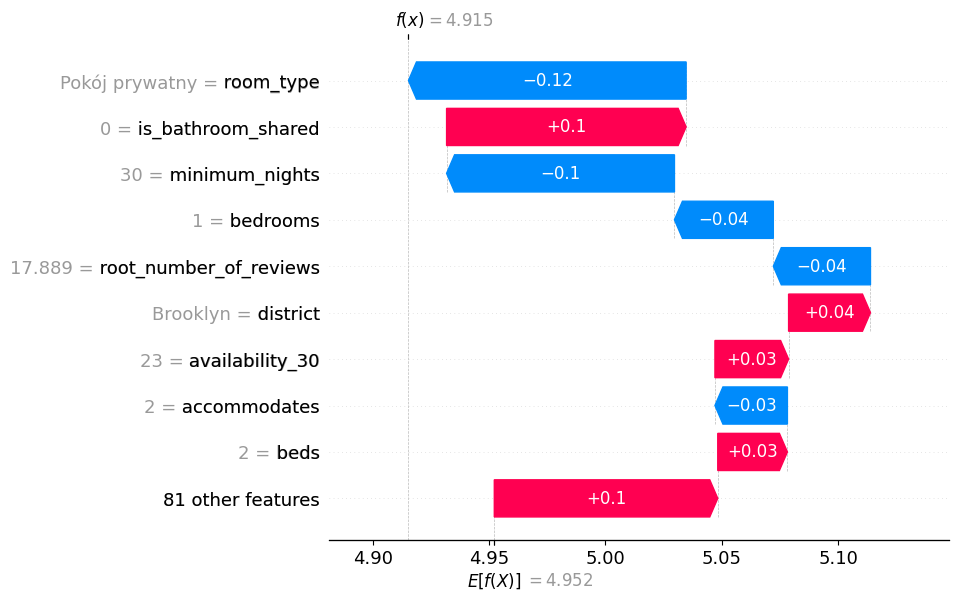

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
shap.plots.waterfall(shap_values[i_med])
plt.show()
plt.clf()

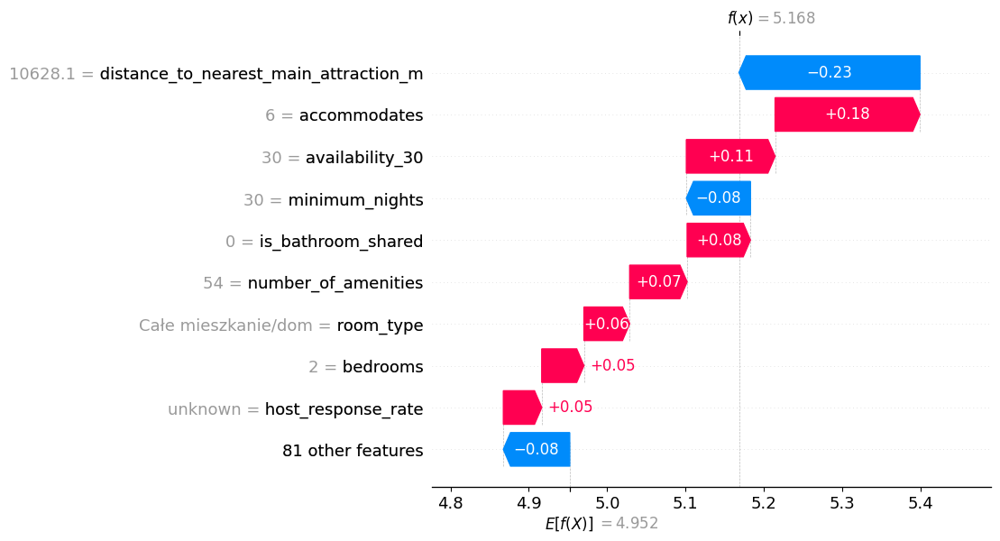

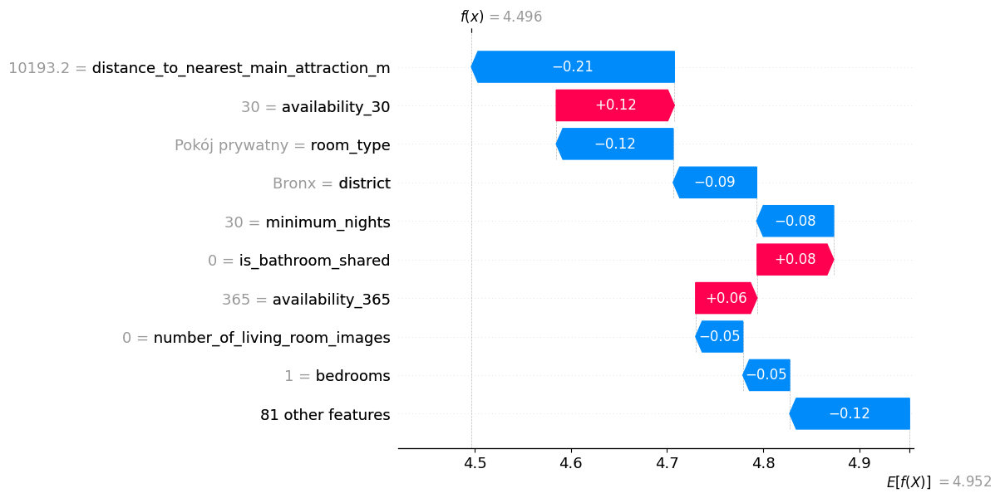

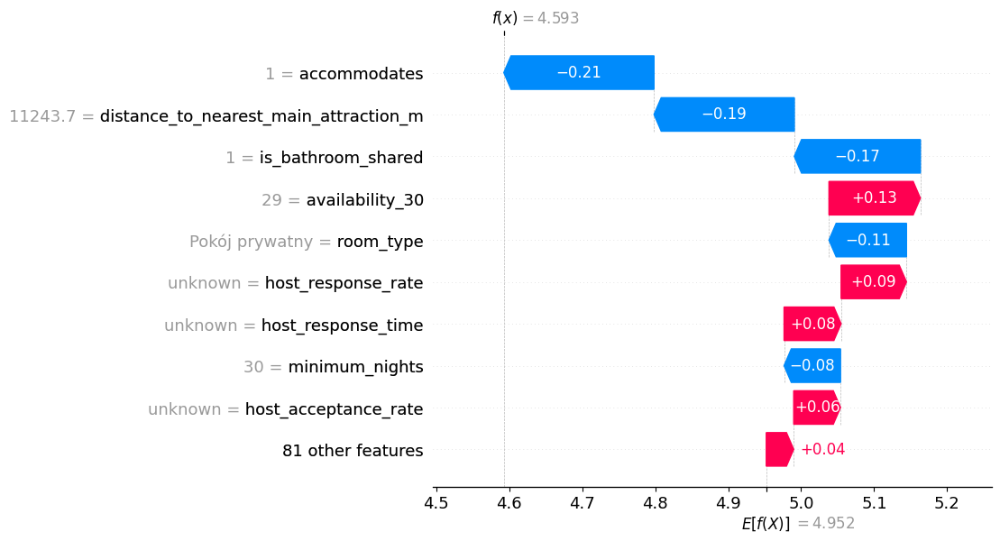

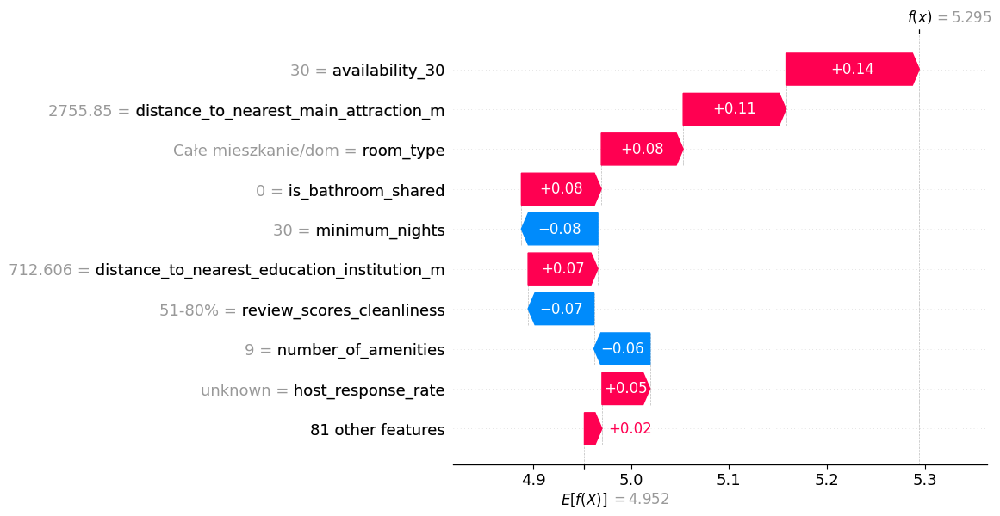

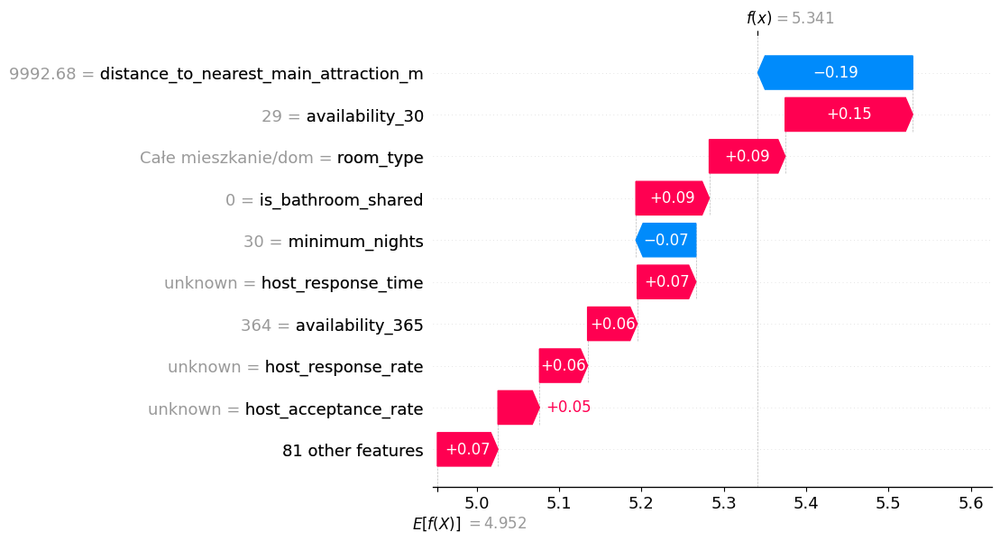

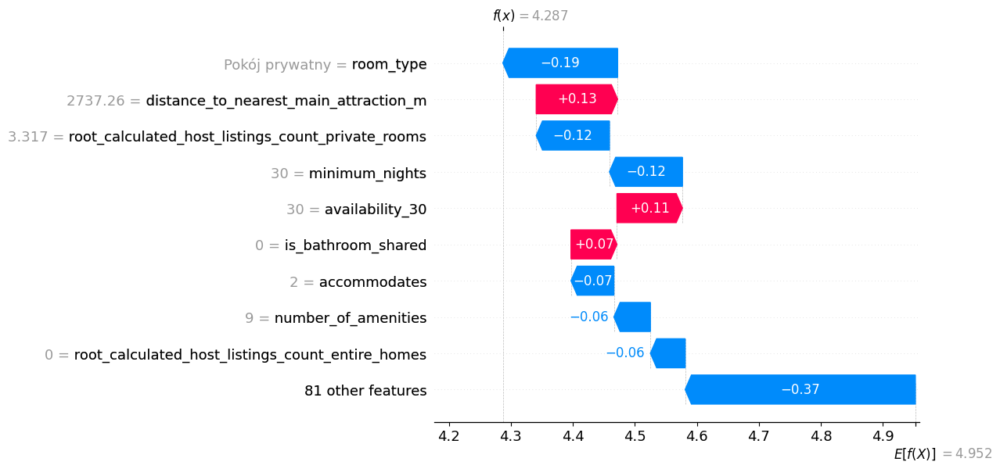

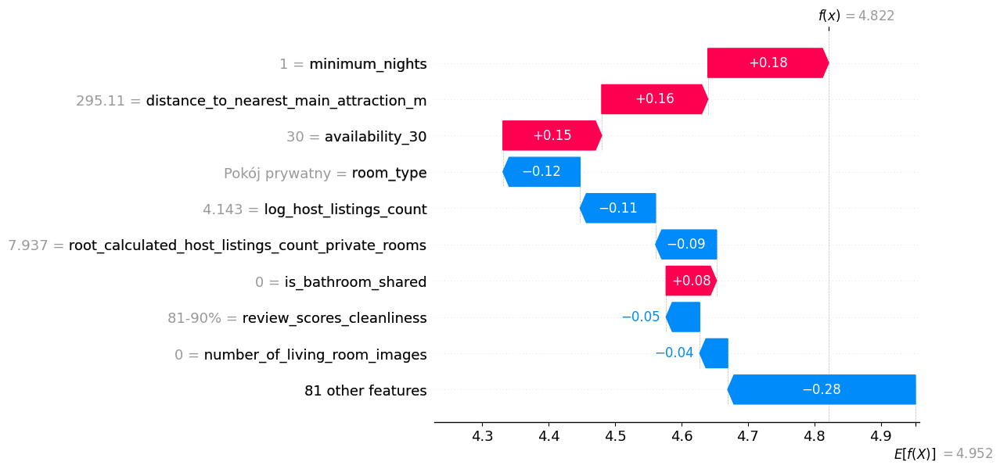

In [33]:
residuals = y_test - y_test_pred
outliers = np.abs(residuals) > 1.5
outliers_df = pd.DataFrame({'y_true': y_test, 'y_pred': y_test_pred, 'residuals': residuals, 'outlier': outliers})
outliers_df.reset_index(drop=True, inplace=True)
outliers = outliers_df['outlier']
outliers_indices = outliers_df[outliers].index.tolist()
#Show waterfall plot for outliers
for i in outliers_indices:
    shap.plots.waterfall(shap_values[i])
    plt.show()
    plt.clf()

### Force plot

True value: 6.9078, Predicted value: 5.2543, Residual: 1.6535


<Figure size 640x480 with 0 Axes>

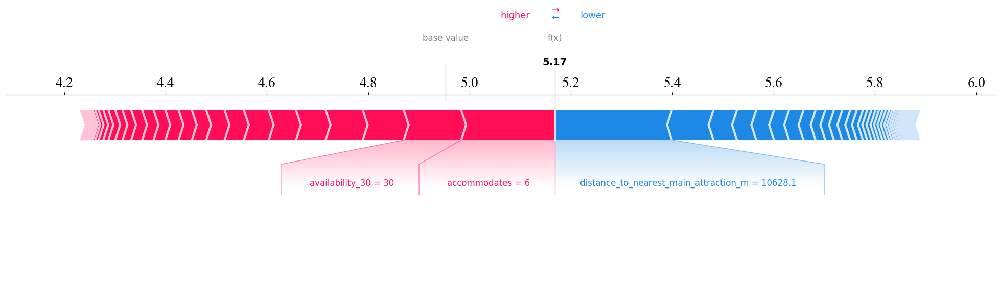

True value: 6.3279, Predicted value: 4.4873, Residual: 1.8406


<Figure size 640x480 with 0 Axes>

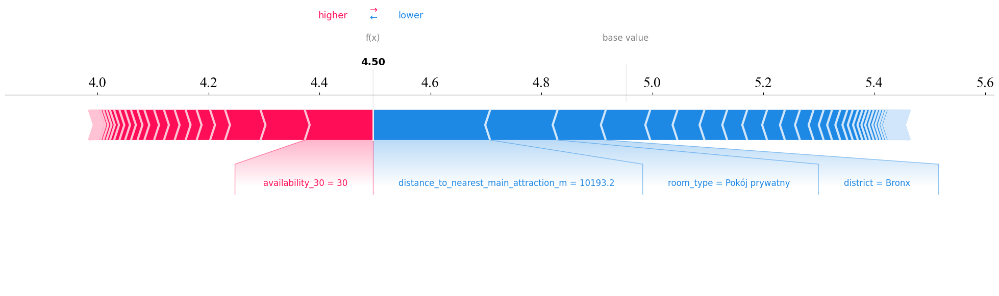

True value: 6.2146, Predicted value: 4.5114, Residual: 1.7033


<Figure size 640x480 with 0 Axes>

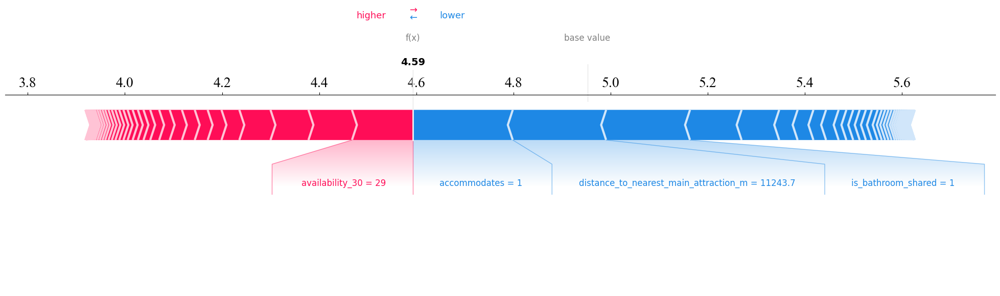

True value: 6.9058, Predicted value: 5.2915, Residual: 1.6143


<Figure size 640x480 with 0 Axes>

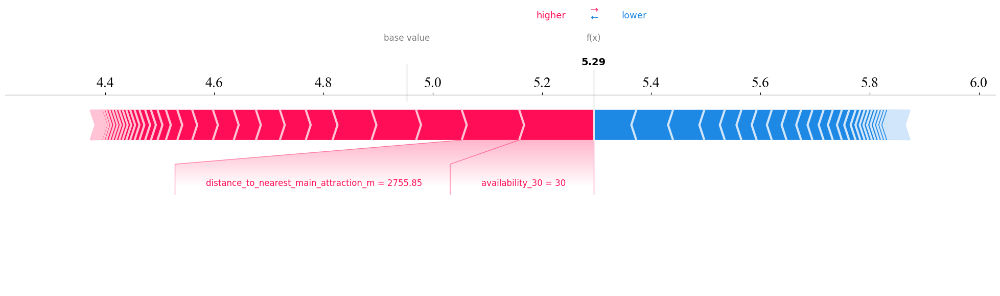

True value: 6.8024, Predicted value: 5.1835, Residual: 1.6189


<Figure size 640x480 with 0 Axes>

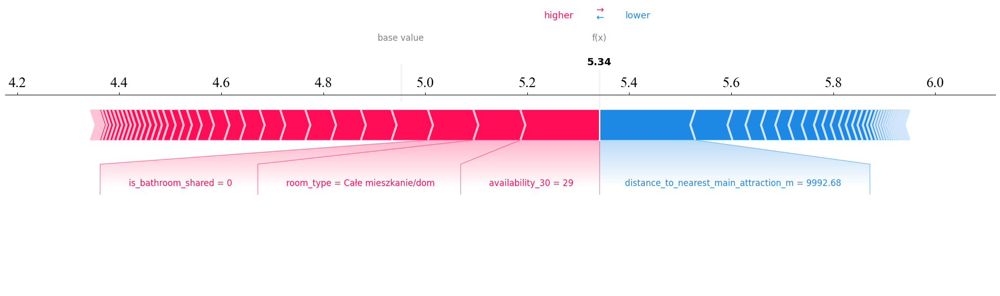

True value: 6.5511, Predicted value: 4.2889, Residual: 2.2622


<Figure size 640x480 with 0 Axes>

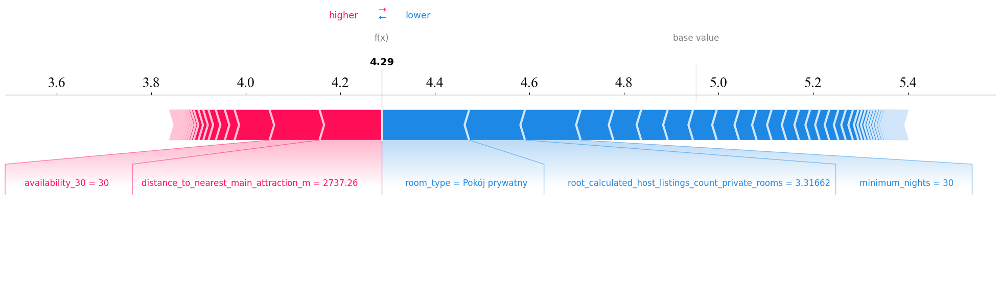

True value: 6.9078, Predicted value: 4.8275, Residual: 2.0803


<Figure size 640x480 with 0 Axes>

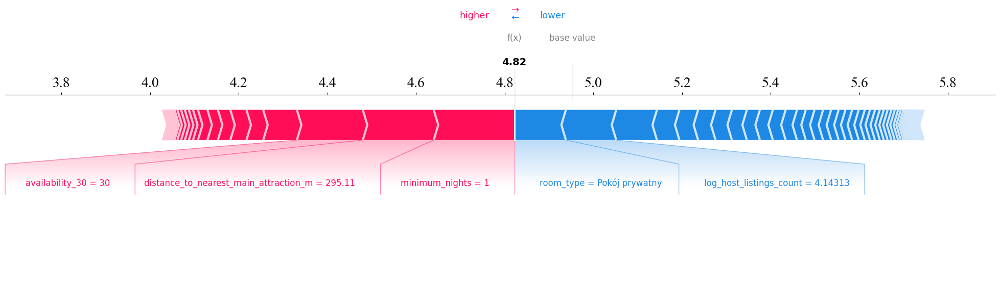

In [34]:
residuals = y_test - y_test_pred
outliers = np.abs(residuals) > 1.5
outliers_df = pd.DataFrame({'y_true': y_test, 'y_pred': y_test_pred, 'residuals': residuals, 'outlier': outliers})
outliers_df.reset_index(drop=True, inplace=True)
outliers = outliers_df['outlier']
outliers_indices = outliers_df[outliers].index.tolist()
for i in outliers_indices:
    print(f"True value: {outliers_df.loc[i, 'y_true']:.4f}, Predicted value: {outliers_df.loc[i, 'y_pred']:.4f}, Residual: {outliers_df.loc[i, 'residuals']:.4f}")
    shap.plots.force(shap_values[i], matplotlib=True, show=False, contribution_threshold=0.07, figsize=(25, 5))
    plt.yticks(fontsize=20, fontname='Times New Roman', color='Black')
    plt.xticks(fontsize=20, fontname='Times New Roman', color='Black')
    plt.show()
    plt.clf()

True value: 4.5539, Predicted value: 5.5791, Residual: -1.0253


<Figure size 640x480 with 0 Axes>

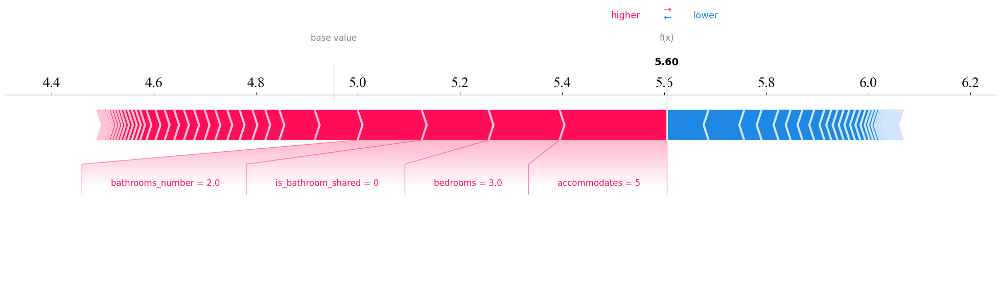

True value: 3.8918, Predicted value: 4.9641, Residual: -1.0723


<Figure size 640x480 with 0 Axes>

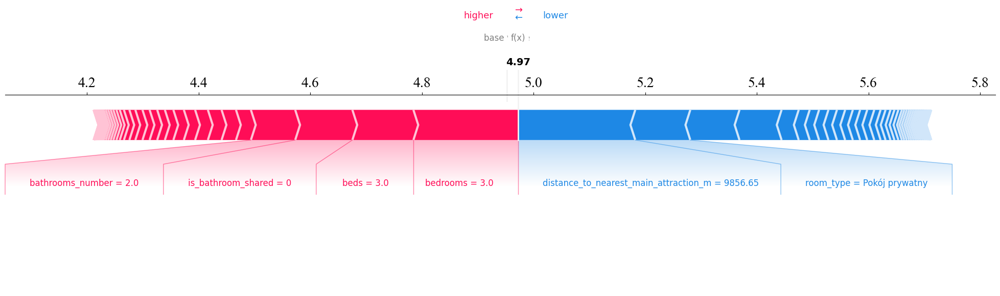

True value: 4.5326, Predicted value: 5.4043, Residual: -0.8717


<Figure size 640x480 with 0 Axes>

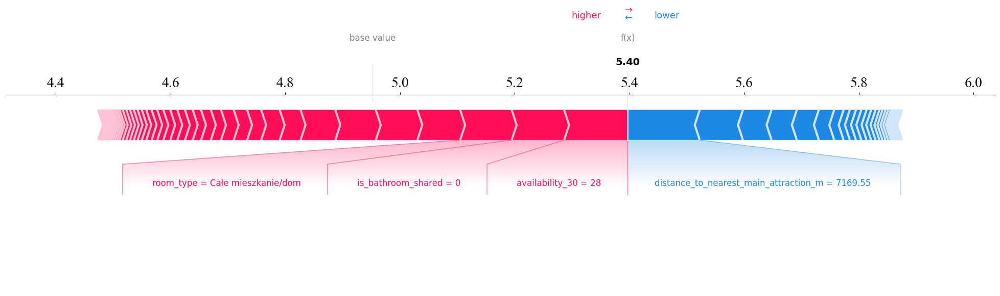

True value: 4.9628, Predicted value: 5.8317, Residual: -0.8689


<Figure size 640x480 with 0 Axes>

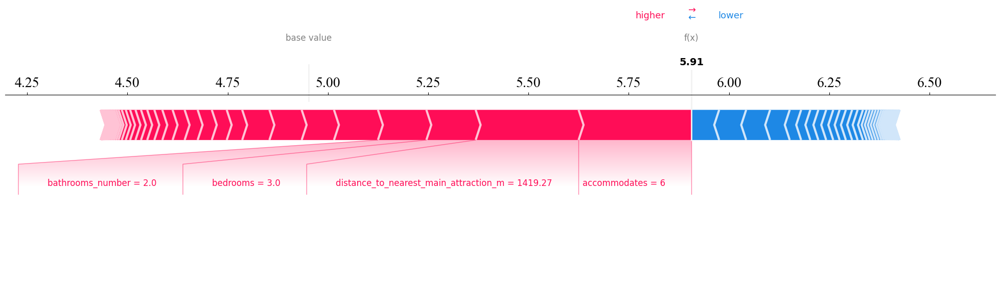

True value: 4.8283, Predicted value: 5.6431, Residual: -0.8148


<Figure size 640x480 with 0 Axes>

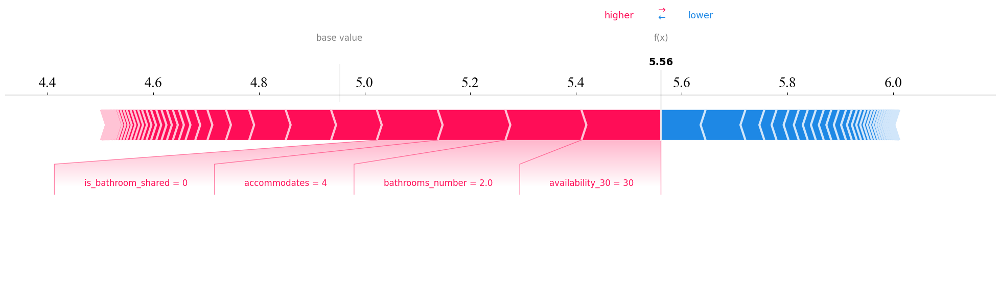

True value: 4.0943, Predicted value: 5.1855, Residual: -1.0911


<Figure size 640x480 with 0 Axes>

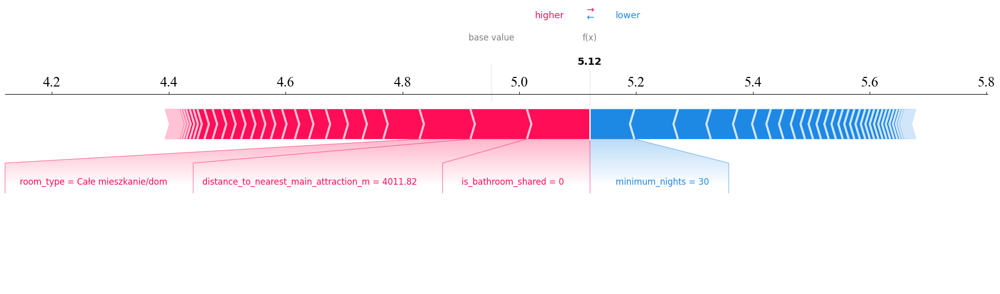

True value: 4.8598, Predicted value: 5.7650, Residual: -0.9052


<Figure size 640x480 with 0 Axes>

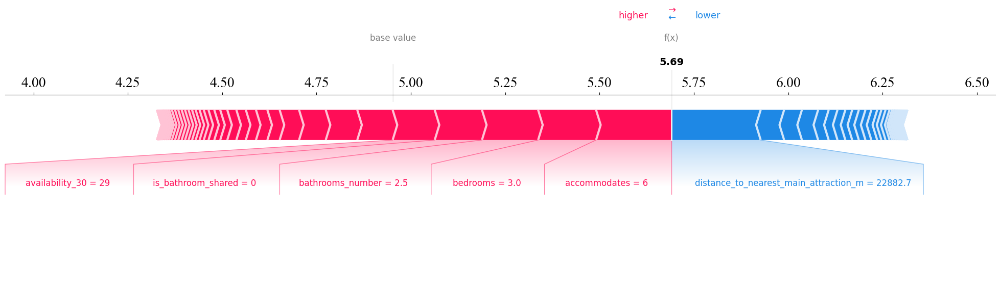

True value: 5.3132, Predicted value: 6.3193, Residual: -1.0061


<Figure size 640x480 with 0 Axes>

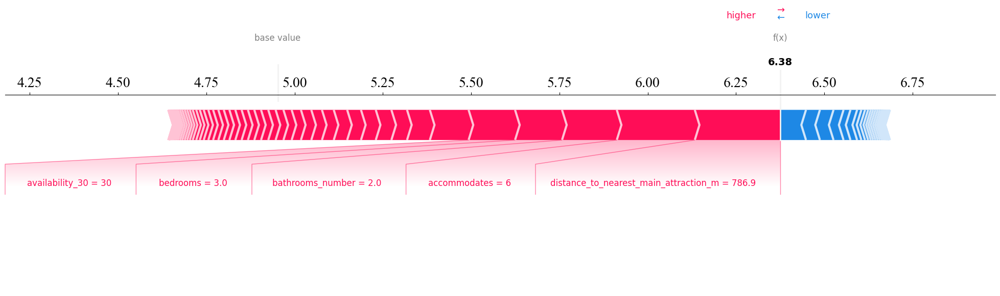

True value: 5.2781, Predicted value: 6.2473, Residual: -0.9692


<Figure size 640x480 with 0 Axes>

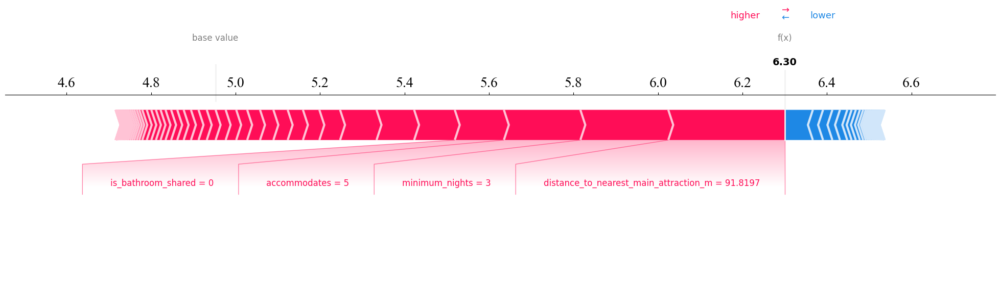

True value: 4.8122, Predicted value: 5.6558, Residual: -0.8436


<Figure size 640x480 with 0 Axes>

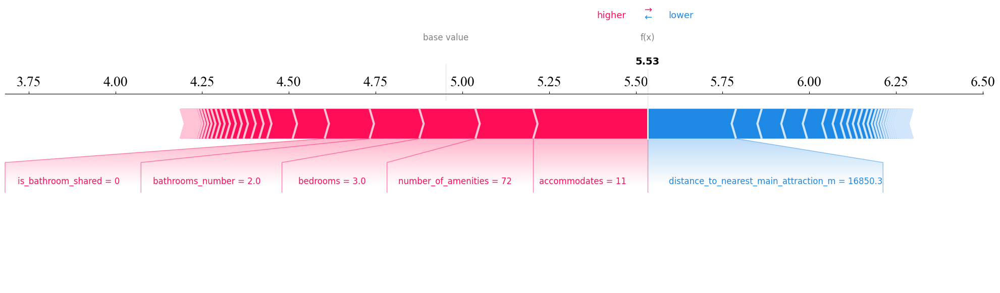

In [42]:
residuals = y_test - y_test_pred
outliers = residuals < -0.8
outliers_df = pd.DataFrame({'y_true': y_test, 'y_pred': y_test_pred, 'residuals': residuals, 'outlier': outliers})
outliers_df.reset_index(drop=True, inplace=True)
outliers = outliers_df['outlier']
outliers_indices = outliers_df[outliers].index.tolist()
#Show waterfall plot for outliers
for i in outliers_indices:
    print(f"True value: {outliers_df.loc[i, 'y_true']:.4f}, Predicted value: {outliers_df.loc[i, 'y_pred']:.4f}, Residual: {outliers_df.loc[i, 'residuals']:.4f}")
    shap.plots.force(shap_values[i], matplotlib=True, show=False, contribution_threshold=0.068, figsize=(25, 5))
    plt.yticks(fontsize=20, fontname='Times New Roman', color='Black')
    plt.xticks(fontsize=20, fontname='Times New Roman', color='Black')
    plt.show()
    plt.clf()

## Global

### Bar plot

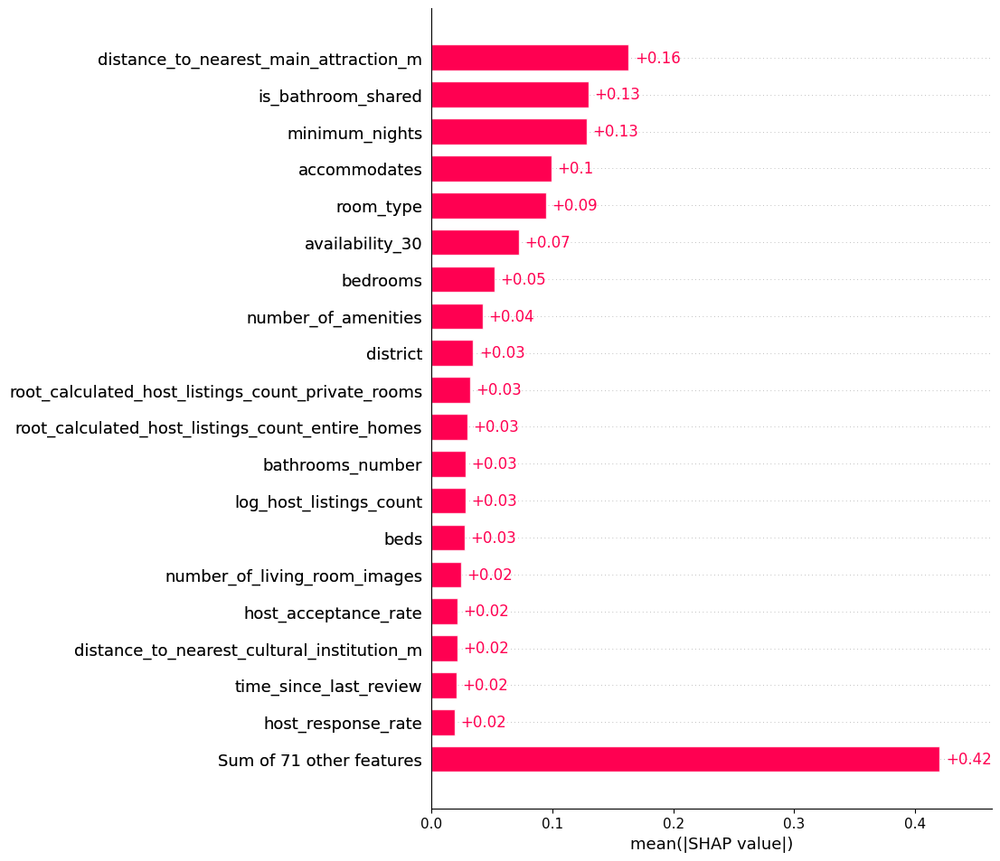

In [ ]:
shap.plots.bar(shap_values, max_display=20, show=False)
plt.show()
plt.clf()

## Beeswarn plot

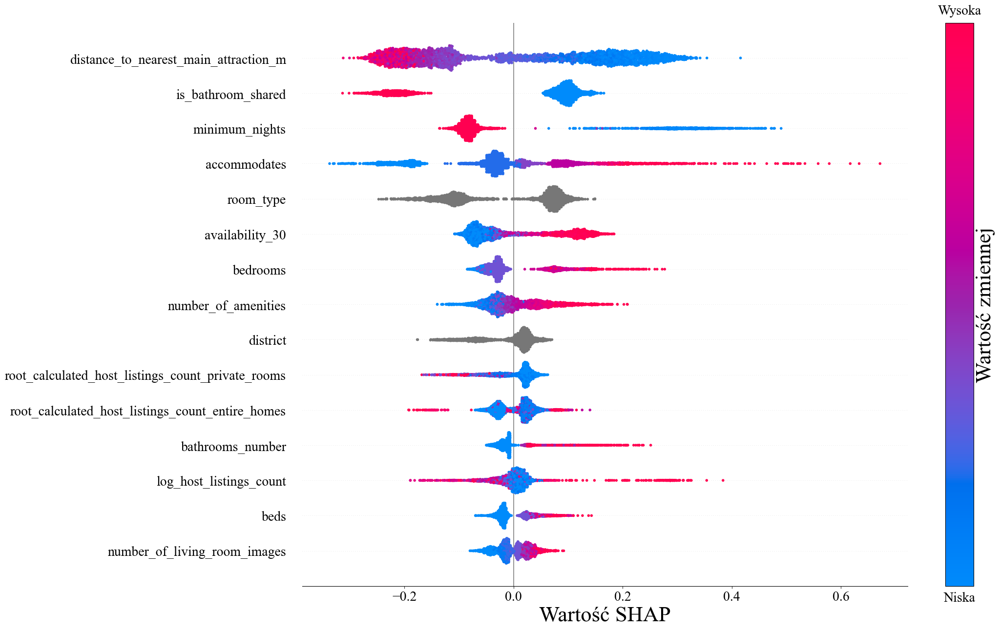

In [38]:
top_n: int = 15
shap.plots.beeswarm(shap_values[:, np.argsort(np.abs(shap_values.values).mean(axis=0))[::-1][:top_n]], max_display=top_n, show=False, plot_size=(20, 15), color_bar=False, color_bar_label="Wartość zmiennej")
plt.gca().set_xlabel("Wartość SHAP", fontdict={'family': 'Times New Roman', 'size': 32, 'color': 'Black'})
plt.yticks(fontsize=20, fontname='Times New Roman', color='Black')
plt.xticks(fontsize=20, fontname='Times New Roman', color='Black')
cbar = plt.colorbar(orientation='vertical')
cbar.set_label('Wartość zmiennej', fontdict={'family': 'Times New Roman', 'size': 32, 'color': 'Black'})
cbar.ax.set_yticklabels([])
cbar.ax.set_yticks([])
cbar.ax.text(0.5, 1.01, 'Wysoka', transform=cbar.ax.transAxes, ha='center', va='bottom', fontsize=20, fontname='Times New Roman', color='Black')
cbar.ax.text(0.5, -0.01, 'Niska', transform=cbar.ax.transAxes, ha='center', va='top', fontsize=20, fontname='Times New Roman', color='Black')
cbar.ax.tick_params(labelsize=20, labelcolor='Black')
plt.show()
plt.clf()

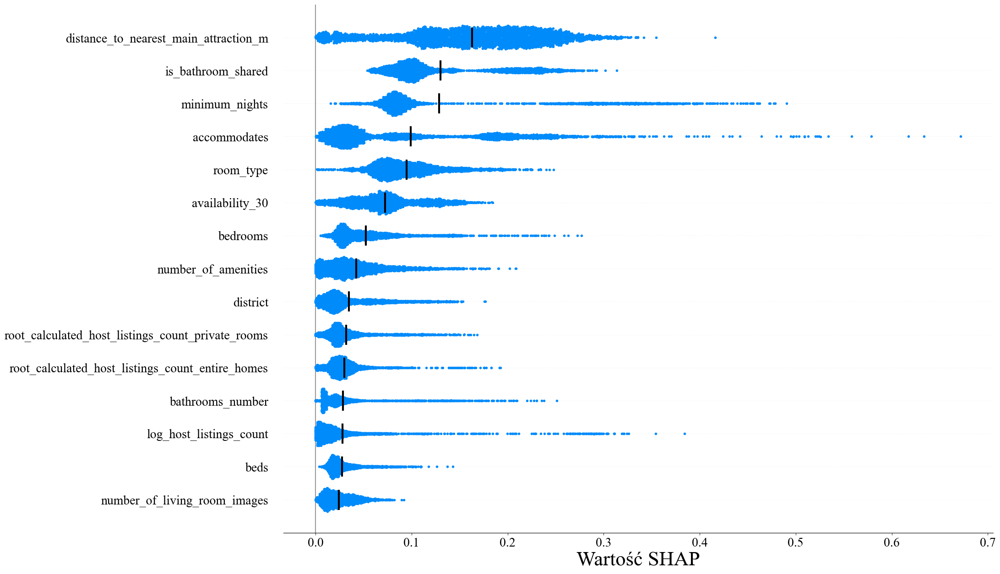

In [39]:
shap.plots.beeswarm(shap_values.abs[:, np.argsort(np.abs(shap_values.values).mean(axis=0))[::-1][:top_n]], color="shap_blue", max_display=top_n, show=False, plot_size=(20, 15), color_bar=False)
ax = plt.gca()
masv = {}
for feature in ax.get_yticklabels():
    feature_name = feature.get_text()
    if feature_name not in X_test.columns:
        continue
    column_index = X_test.columns.get_loc(feature_name)
    mean_absolute_shap_value = np.mean(np.abs(shap_values.values[:, column_index]))
    masv[feature_name] = mean_absolute_shap_value

ax.scatter(masv.values(), range(len(masv)), zorder=99, label="Mean Absolute SHAP Value", color="black", marker="|", linewidths=3, s=1000)
plt.gca().set_xlabel("Wartość SHAP", fontdict={'family': 'Times New Roman', 'size': 32, 'color': 'Black'})
plt.yticks(fontsize=20, fontname='Times New Roman', color='Black')
plt.xticks(fontsize=20, fontname='Times New Roman', color='Black')
plt.show()
plt.clf()

### Dependence plot

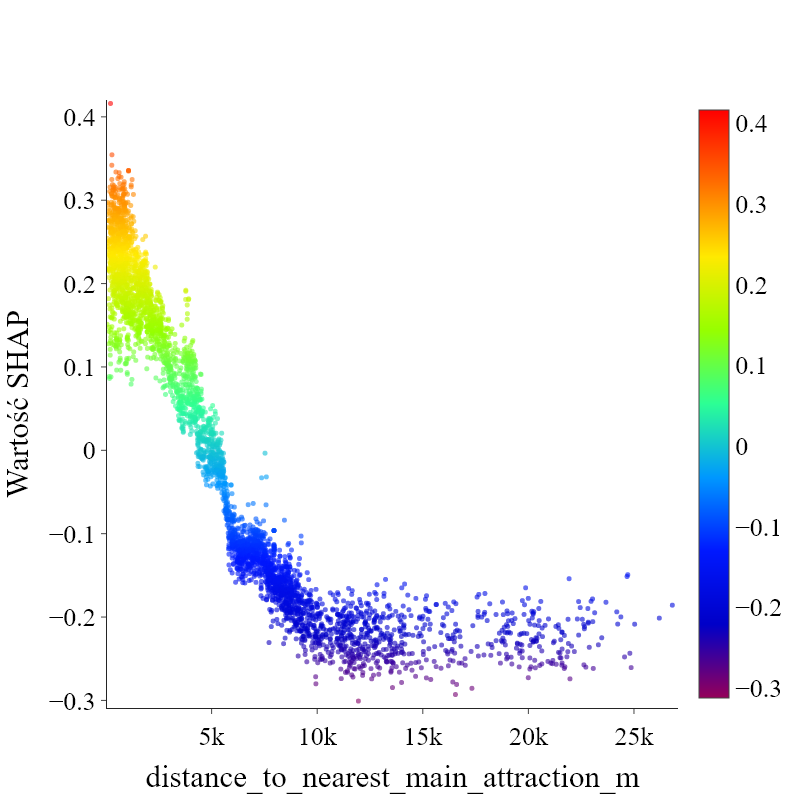

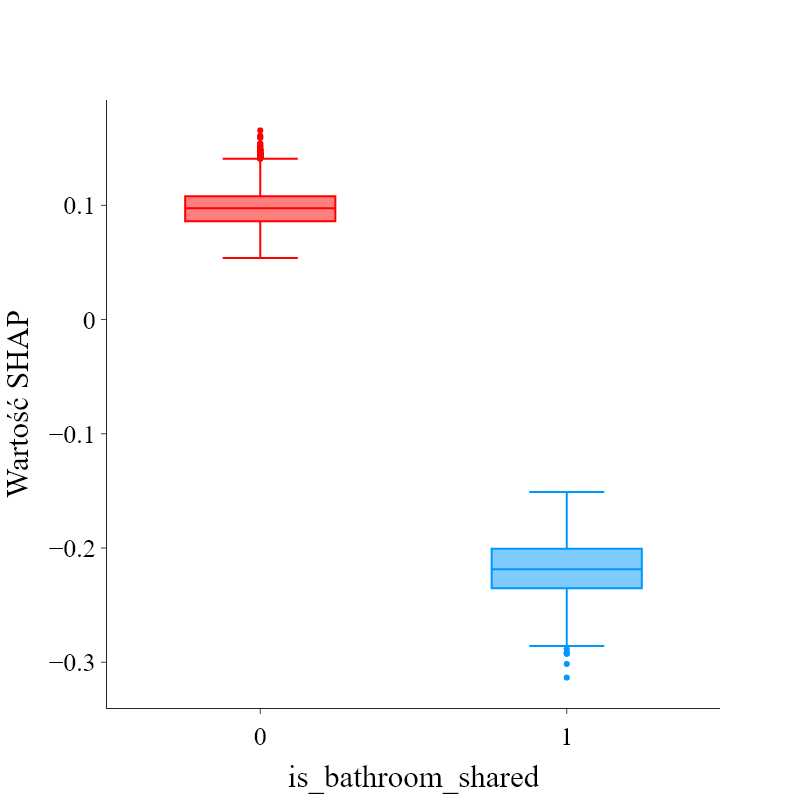

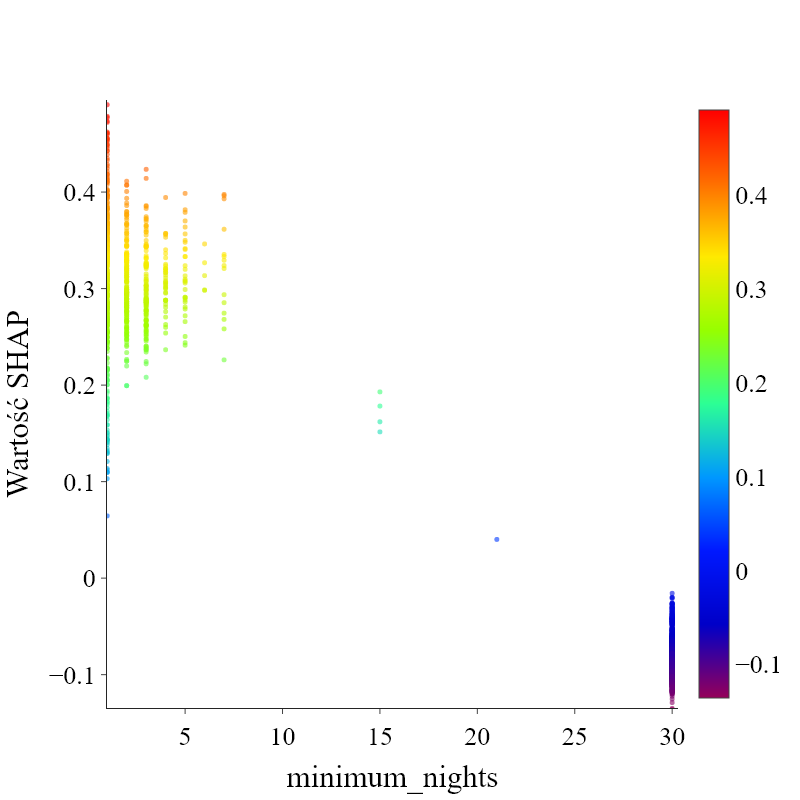

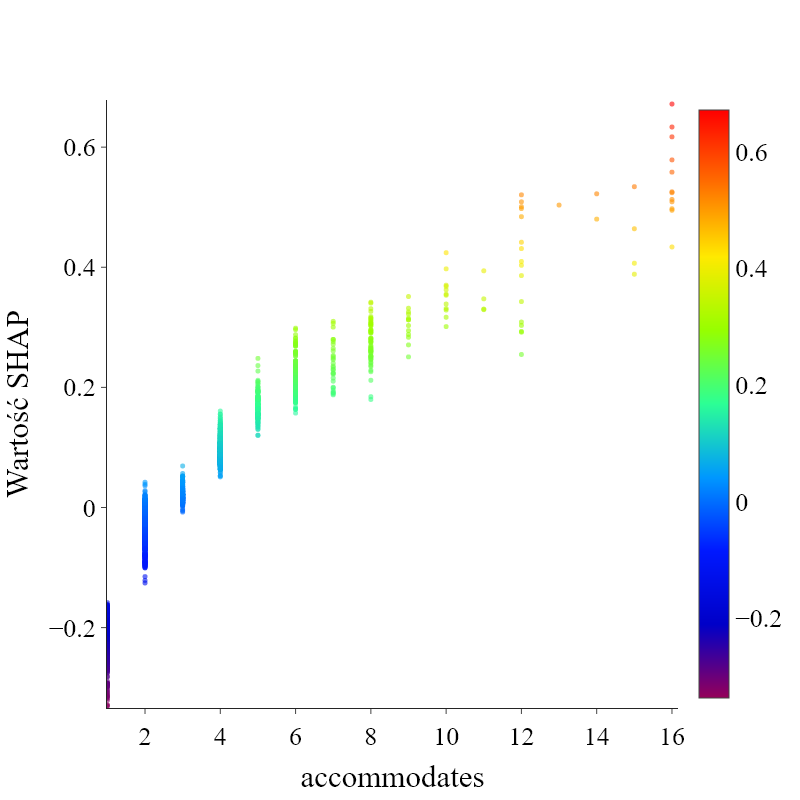

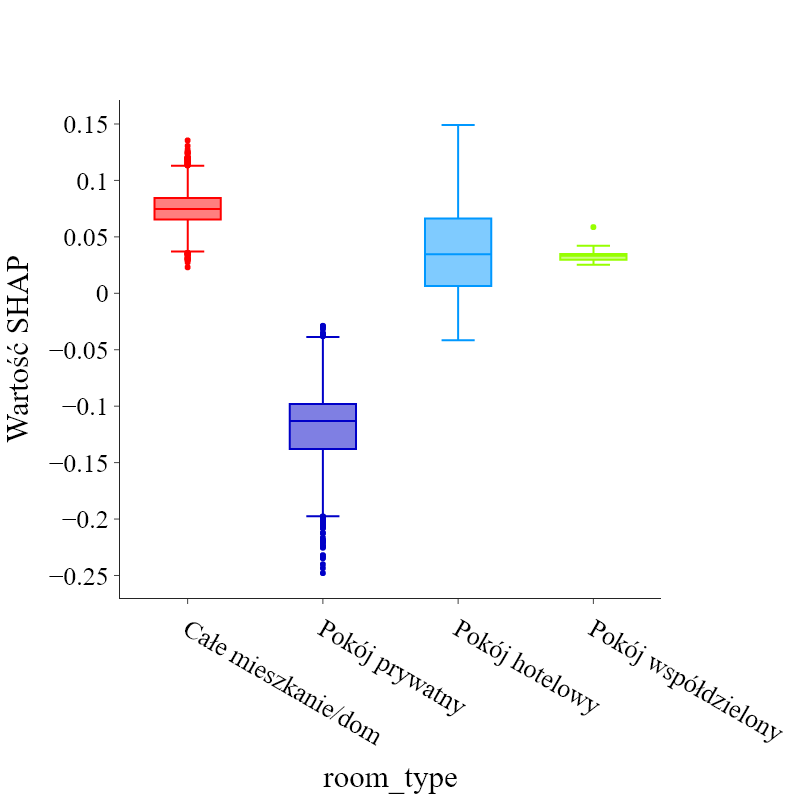

...

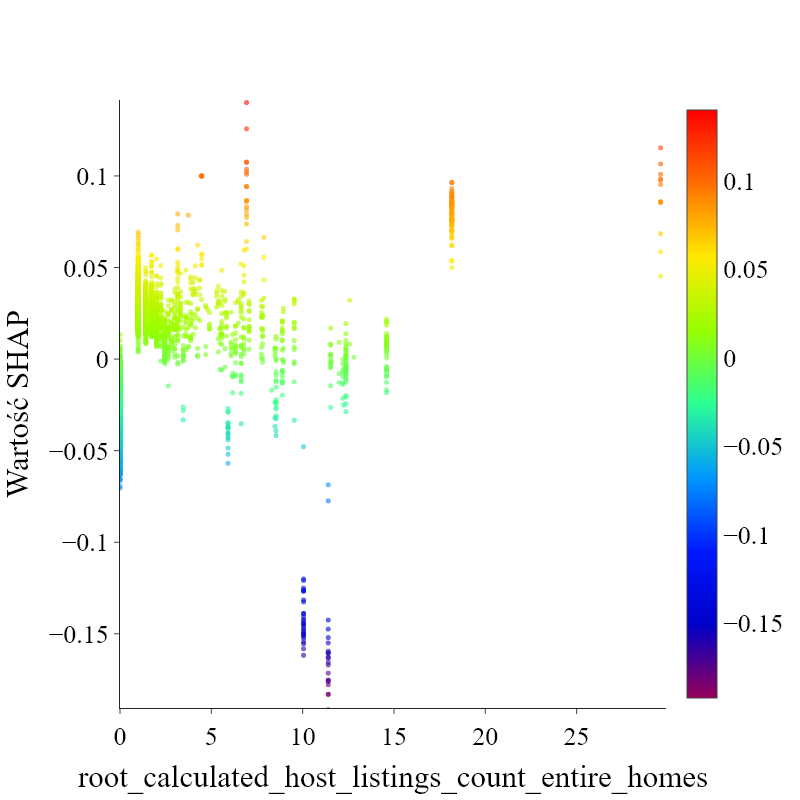

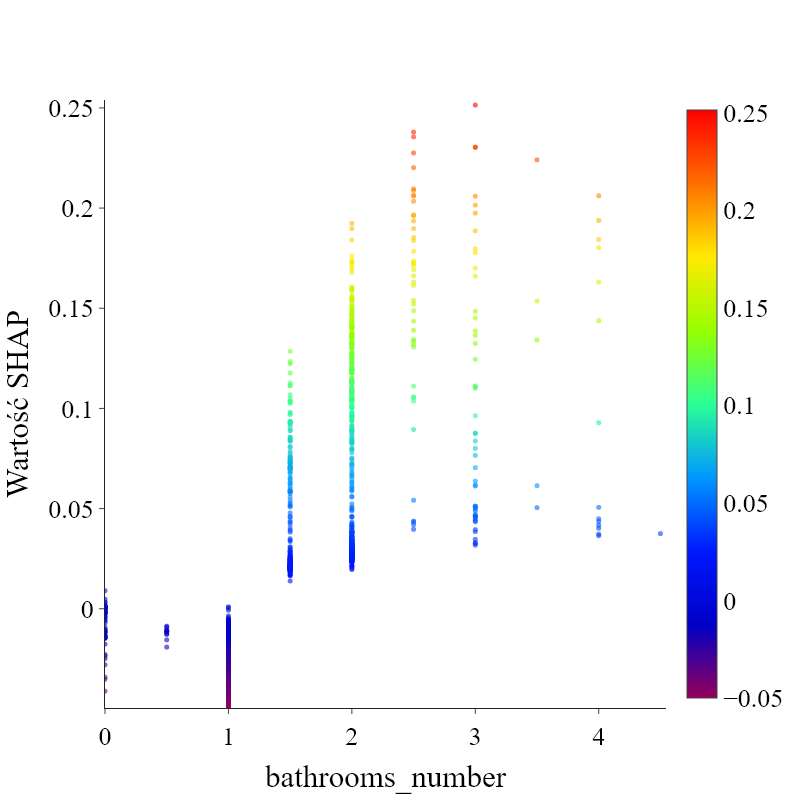

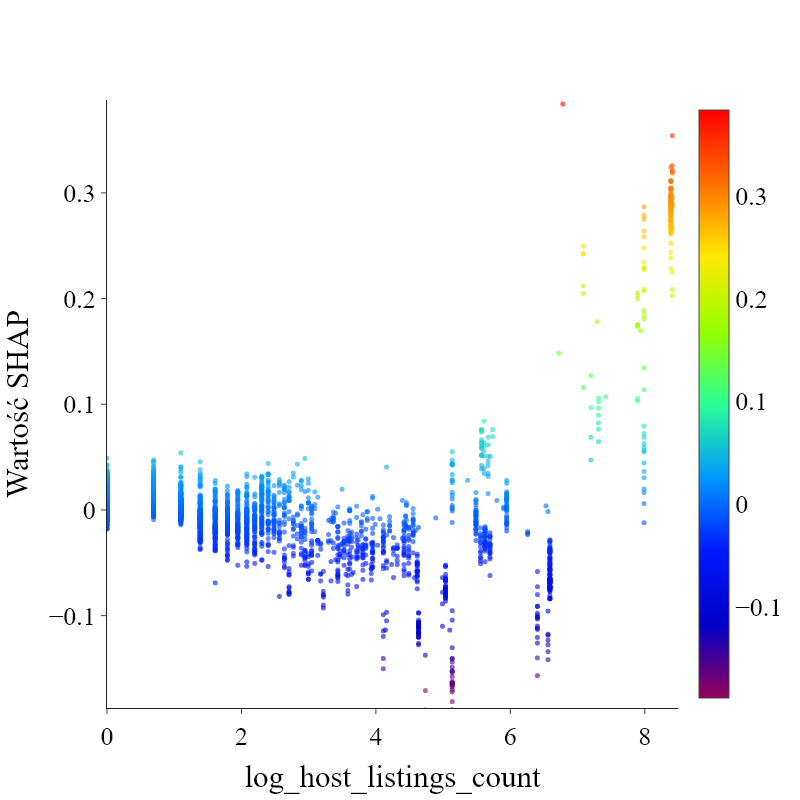

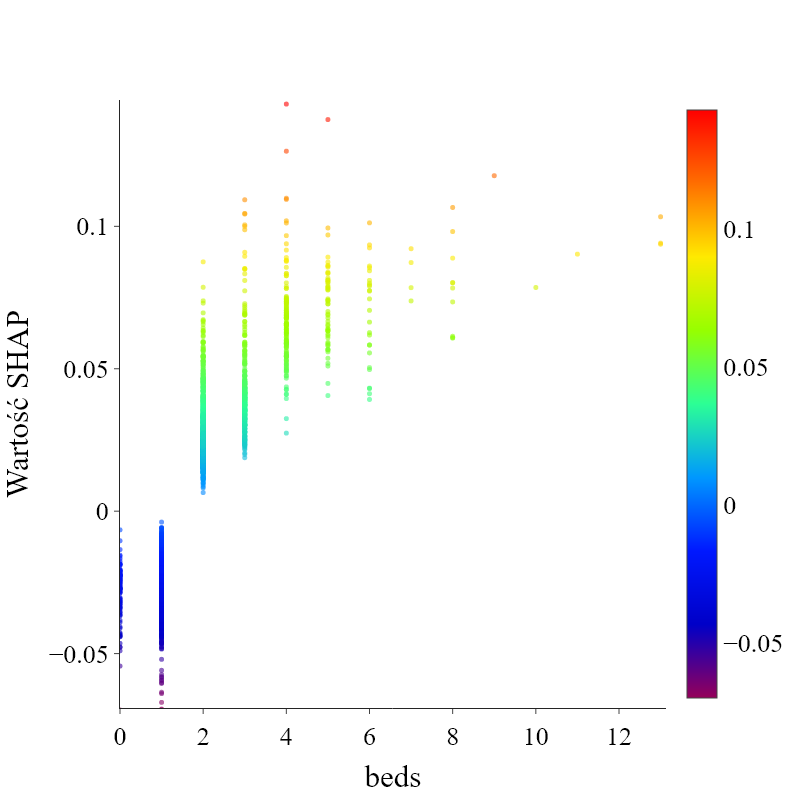

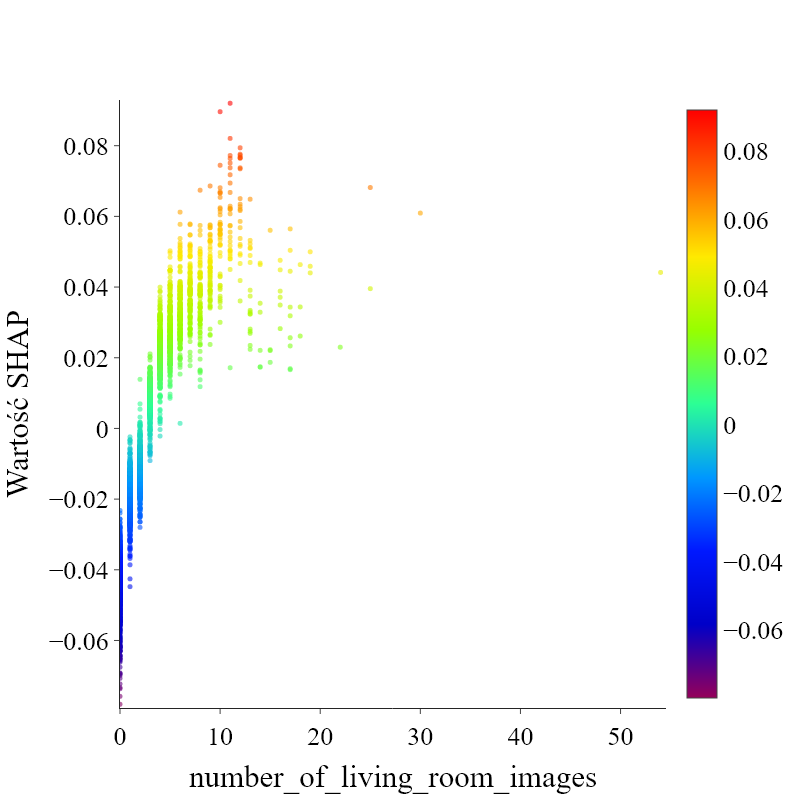

In [40]:
for i, (feature, values) in enumerate(sorted(masv.items(), key=lambda x: x[1], reverse=True)):
    if i < top_n:
        scatter = shap_values[:,feature]
        if feature in categorical_features:
            labels = np.array(pd.Series(scatter.data).value_counts().index)
            fig = go.Figure()
            color_scale = px.colors.sequential.Rainbow
            norm = plt.Normalize(0, len(labels))
            colors = [color_scale[int(norm(i)*len(color_scale)-1)] for i in range(len(labels))]
            for color_idx, category in enumerate(labels):
                indices = list(np.where(scatter.data==category)[0])
                grouped_data = list(scatter.values[indices])
                fig.add_trace(go.Box(y=grouped_data, name=str(category), marker=dict(color=colors[color_idx]), showlegend=False ))
            fig.update_layout(template="simple_white", width=800, height=800, title_x=0.5, xaxis_title=feature, yaxis_title="Wartość SHAP", font=dict(family="Times New Roman",size=26,color="Black"), showlegend=False)
            fig.show("png")
        else:
            fig = go.Figure()
            fig.add_trace(go.Scatter(x=scatter.data, y=scatter.values, mode='markers', marker=dict(size=5, opacity=0.6, color=scatter.values, colorscale=px.colors.sequential.Rainbow, showscale=True, colorbar=dict(thickness=30)),showlegend=False))
            fig.update_layout(template="simple_white", width=800, height=800, title_x=0.5, xaxis_title=feature, yaxis_title="Wartość SHAP", font=dict(family="Times New Roman",size=26,color="Black"), showlegend=False)
            fig.update_xaxes(range=[scatter.data.min()-0.01 * scatter.data.min(), scatter.data.max()+0.01 * scatter.data.max()])
            fig.update_yaxes(range=[scatter.values.min()-0.01 * scatter.values.min(), scatter.values.max()+0.01 * scatter.values.max()])
            fig.show("png")